In [41]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
data = pd.read_csv('data_client.csv')

In [3]:
data.head()

,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_status,delevery_time,estimated_delevery_time,order_item_id,price,product_category_name,product_weight_g,product_volume_dm3,review_score,payment_type,payment_installments,payment_value,montant_total,recence,frequence
0,0000366f3b9a7992bf8c76cfdf3221e2,7787,cajamar,SP,delivered,6.0,10,1.0,129.90,furniture,1500.0,7.616,5.0,credit_card,8.0,141.90,141.90,160,1
1,0000b849f77a49e4a4ce2b2a4ca5be3f,6053,osasco,SP,delivered,3.0,7,1.0,18.90,health_beauty,375.0,5.148,4.0,credit_card,1.0,27.19,27.19,163,1
2,0000f46a3911fa3c0805444483337064,88115,sao jose,SC,delivered,25.0,27,1.0,69.00,supply,1500.0,43.750,3.0,credit_card,8.0,86.22,86.22,585,1
3,0000f6ccb0745a6a4b88665a16c9f078,66812,belem,PA,delivered,20.0,31,1.0,25.99,communication,150.0,1.045,4.0,credit_card,4.0,43.62,43.62,369,1
4,0004aac84e0df4da2b147fca70cf8255,18040,sorocaba,SP,delivered,13.0,20,1.0,180.00,communication,6050.0,0.528,5.0,credit_card,6.0,196.89,196.89,336,1


In [4]:
new_name = {
    'customer_zip_code_prefix': 'zip_code',
    'customer_city': 'city',
    'customer_state': 'state', 
    'order_item_id': 'nb_item', 
    'price' : 'mean_item_price',
    'payment_value' : 'mean_order_price',
}
data = data.rename(columns=new_name)
data.head(2)

,customer_unique_id,zip_code,city,state,order_status,delevery_time,estimated_delevery_time,nb_item,mean_item_price,product_category_name,product_weight_g,product_volume_dm3,review_score,payment_type,payment_installments,mean_order_price,montant_total,recence,frequence
0,0000366f3b9a7992bf8c76cfdf3221e2,7787,cajamar,SP,delivered,6.0,10,1.0,129.9,furniture,1500.0,7.616,5.0,credit_card,8.0,141.90,141.90,160,1
1,0000b849f77a49e4a4ce2b2a4ca5be3f,6053,osasco,SP,delivered,3.0,7,1.0,18.9,health_beauty,375.0,5.148,4.0,credit_card,1.0,27.19,27.19,163,1


In [5]:
data.describe()

,zip_code,delevery_time,estimated_delevery_time,nb_item,mean_item_price,product_weight_g,product_volume_dm3,review_score,payment_installments,mean_order_price,montant_total,recence,frequence
count,96096.000000,93356.000000,96096.000000,95420.000000,93756.000000,93661.000000,94473.000000,95380.000000,96095.000000,95354.000000,96096.000000,96096.000000,96096.000000
mean,35185.761832,12.101236,23.383825,1.070615,112.628292,1902.575104,13.779286,4.084696,2.902397,145.962854,190.089231,287.735691,1.034809
std,29801.656868,9.553427,8.782161,0.266995,116.045084,3008.339356,17.804109,1.342024,2.678879,145.222015,330.862671,153.414676,0.214384
min,1003.000000,0.000000,1.000000,1.000000,9.990000,75.000000,0.352000,1.000000,0.000000,7.300000,0.000000,0.000000,1.000000
25%,11405.000000,6.000000,18.000000,1.000000,43.000000,300.000000,2.816000,4.000000,1.000000,60.750000,62.797500,163.000000,1.000000
50%,24440.000000,10.000000,23.000000,1.000000,79.000000,700.000000,6.384000,5.000000,2.000000,103.140000,111.610000,268.000000,1.000000
75%,59035.500000,15.000000,28.000000,1.000000,139.000000,1800.000000,18.000000,5.000000,4.000000,173.270000,198.402500,397.000000,1.000000
max,99990.000000,209.000000,155.000000,11.000000,895.000000,18600.000000,112.896000,5.000000,24.000000,1222.800000,27935.460000,772.000000,17.000000


In [6]:
data.columns

Index(['customer_unique_id', 'zip_code', 'city', 'state', 'order_status',
       'delevery_time', 'estimated_delevery_time', 'nb_item',
       'mean_item_price', 'product_category_name', 'product_weight_g',
       'product_volume_dm3', 'review_score', 'payment_type',
       'payment_installments', 'mean_order_price', 'montant_total', 'recence',
       'frequence'],
      dtype='object')

## Etapes : 
 
    1- Selection des variables pour le clustering
    2- Standardisation des variables numériques, encodage variable categorielle 
    3- Choix du nombre de cluster : 
        - Méthode Elbow
        - Coefficient de silhouette
        - Indice de Calinski-Harabasz
        - Indice de Davies-bouldin
    4- Clustering
    5- Analyse des clusters
    6- Interpretation des clusters

## 1.  K-means

### Test n°1 : 

In [43]:
# Sélection des variables :

cols_cluster = ['product_category_name', 'product_weight_g', 'review_score',
               'payment_installments', 'montant_total', 'recence', 'frequence']
df = data[cols_cluster]

In [44]:
df.head(2)

,product_category_name,product_weight_g,review_score,payment_installments,montant_total,recence,frequence
0,furniture,1500.0,5.0,8.0,141.90,160,1
1,health_beauty,375.0,4.0,1.0,27.19,163,1


In [45]:
import warnings
warnings.filterwarnings("ignore")

In [46]:
df.drop_duplicates(inplace=True)
df = df.dropna()
df = df.reset_index(drop=True)
df.shape

(92522, 7)

In [47]:
df['product_category_name'] = df['product_category_name'].astype('category')
df.dtypes

product_category_name    category
product_weight_g          float64
review_score              float64
payment_installments      float64
montant_total             float64
recence                     int64
frequence                   int64
dtype: object

In [48]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer

In [49]:
# Standardisation - standardScaler
# encodage - OneHotEncoder

numeric_col = df.select_dtypes(include=['int64', 'float64']).columns
cat_col = df.select_dtypes(exclude=['int64', 'float64']).columns



preprocessor = ColumnTransformer(
                transformers= [
                    ('numeric', StandardScaler(), numeric_col),
                    ('categorical', OneHotEncoder(drop='first'), cat_col)
                ])
df_transformed = preprocessor.fit_transform(df)

In [50]:
# Nom des colonnes après encodage
encoded_feature_names = preprocessor.named_transformers_['categorical'].get_feature_names_out(cat_col)

# Créer le DataFrame résultant
features = list(numeric_col) + list(encoded_feature_names)
df_transformed = pd.DataFrame(df_transformed, columns=features)
df_transformed.head(2)

,product_weight_g,review_score,payment_installments,montant_total,recence,frequence,product_category_name_art_music,product_category_name_book,product_category_name_communication,product_category_name_computers,product_category_name_fashion,product_category_name_food,product_category_name_furniture,product_category_name_health_beauty,product_category_name_home,product_category_name_leisure,product_category_name_other,product_category_name_supply,product_category_name_tools
0,-0.133686,0.677473,1.917456,-0.141409,-0.829857,-0.1646,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,-0.507512,-0.077720,-0.712197,-0.487566,-0.810265,-0.1646,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


## Clustering : K-means

#### Choix du nombre de clusters : méthode Elbow

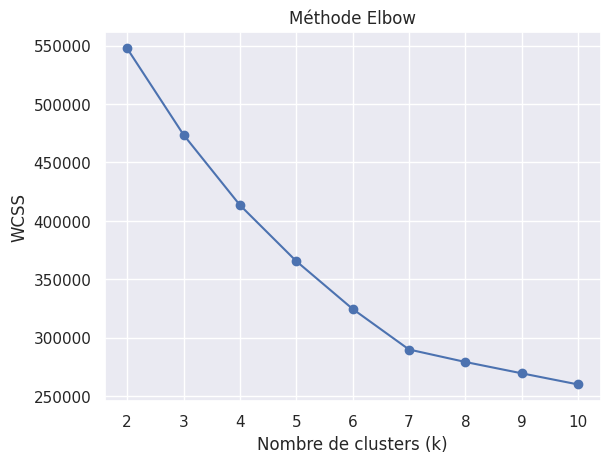

In [54]:
from sklearn.cluster import KMeans
import warnings
warnings.filterwarnings("ignore")


wcss = []  # Liste pour stocker les valeurs de WCSS -somme des carrés des distances intra-cluster

for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=123)
    kmeans.fit(df_transformed)
    wcss.append(kmeans.inertia_)  

# Tracer le graphique du coude
plt.plot(range(2, 11), wcss, marker='o')
plt.title('Méthode Elbow')
plt.xlabel('Nombre de clusters (k)')
plt.ylabel('WCSS')
plt.show()

Le nombre de clusters optimal semble k=7

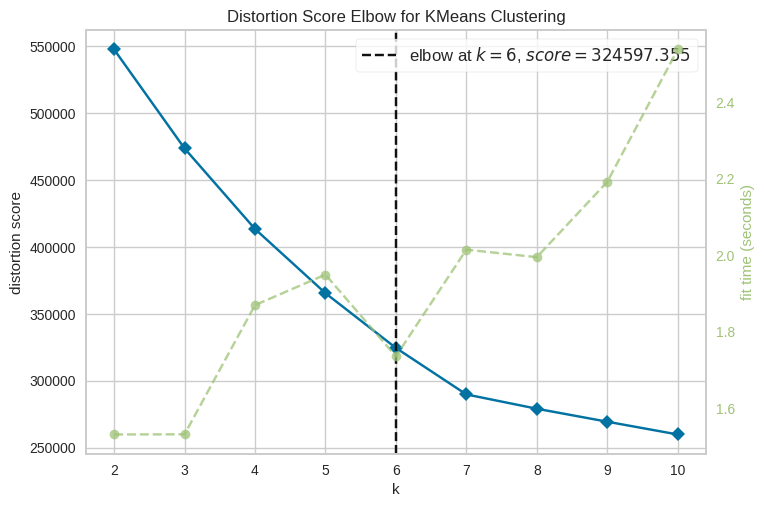

In [71]:
from yellowbrick.cluster import KElbowVisualizer


# Instantiate the clustering model and visualizer
model = KMeans(init='k-means++', random_state=123)
visualizer = KElbowVisualizer(model, k=(2,11))

visualizer.fit(df_transformed)        
visualizer.show() 

Le graphique ci-dessus montre que le nombre de cluster optimal est 6

#### Choix du nombre de clusters : coeffcient de silhouette, indice de Calinski-Harabasz et indice de Davies-Bouldin

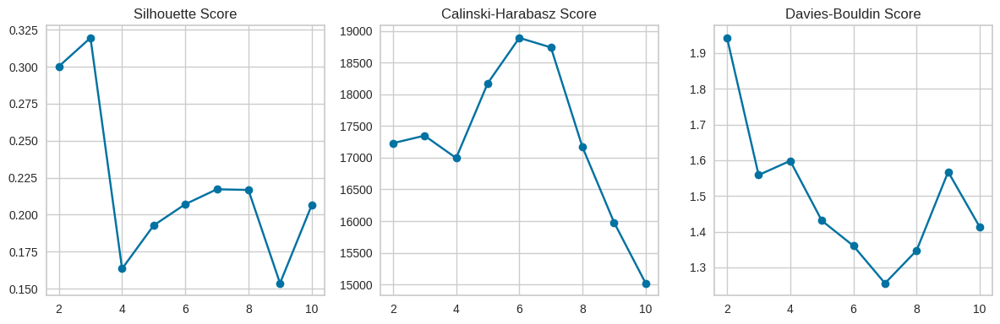

In [38]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score


# Liste pour stocker les métriques
silhouette_scores = []
calinski_scores = []
davies_bouldin_scores = []

# Nombre de clusters à tester
for n_clusters in range(2, 11):
     # Appliquer K-means
    kmeans = KMeans(n_clusters=n_clusters, init='k-means++', random_state=123)
    labels = kmeans.fit_predict(df_transformed)
    # Calculer les métriques
    silhouette_scores.append(silhouette_score(df_transformed, labels))
    calinski_scores.append(calinski_harabasz_score(df_transformed, labels))
    davies_bouldin_scores.append(davies_bouldin_score(df_transformed, labels))

# Tracer les métriques
plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.plot(range(2, 11), silhouette_scores, marker='o')
plt.title('Silhouette Score')

plt.subplot(1, 3, 2)
plt.plot(range(2, 11), calinski_scores, marker='o')
plt.title('Calinski-Harabasz Score')

plt.subplot(1, 3, 3)
plt.plot(range(2, 11), davies_bouldin_scores, marker='o')
plt.title('Davies-Bouldin Score')

plt.tight_layout()
plt.show()

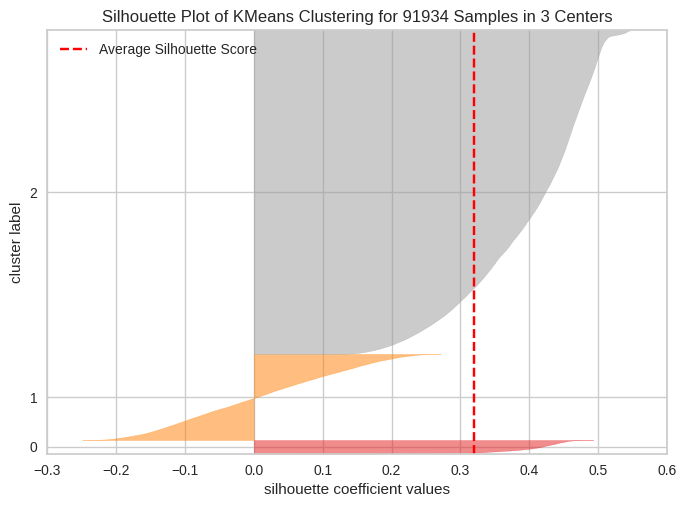

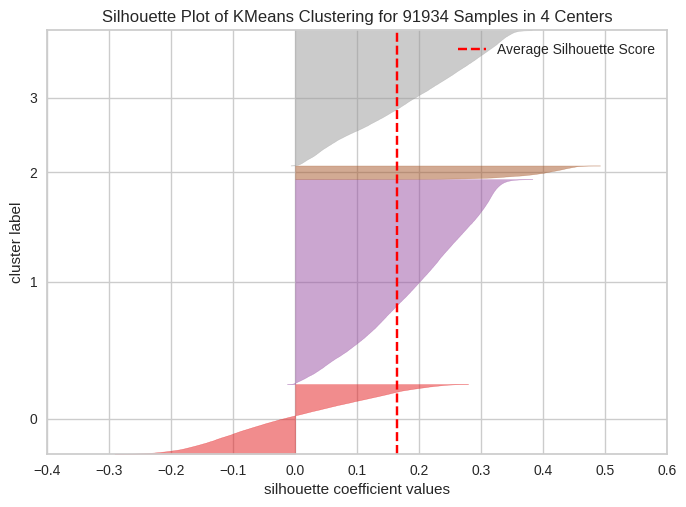

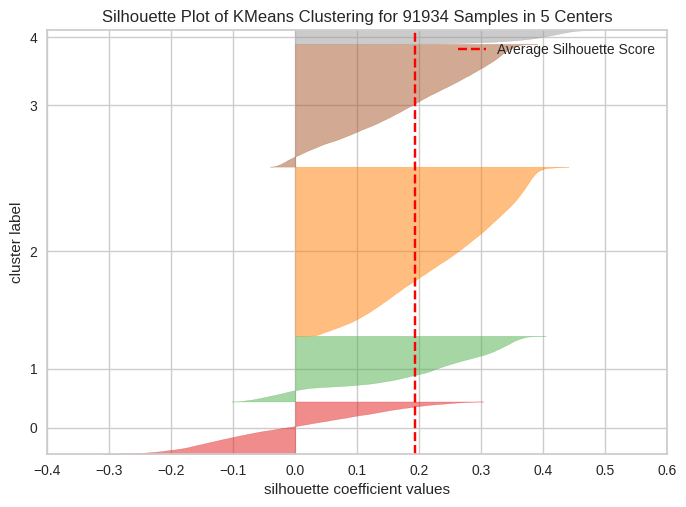

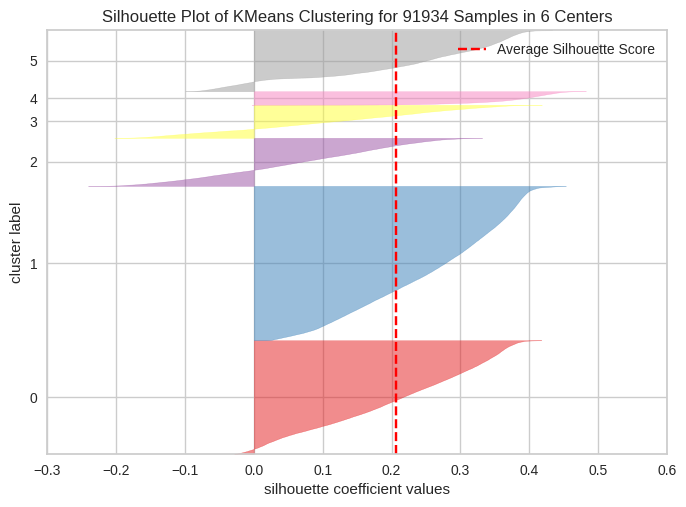

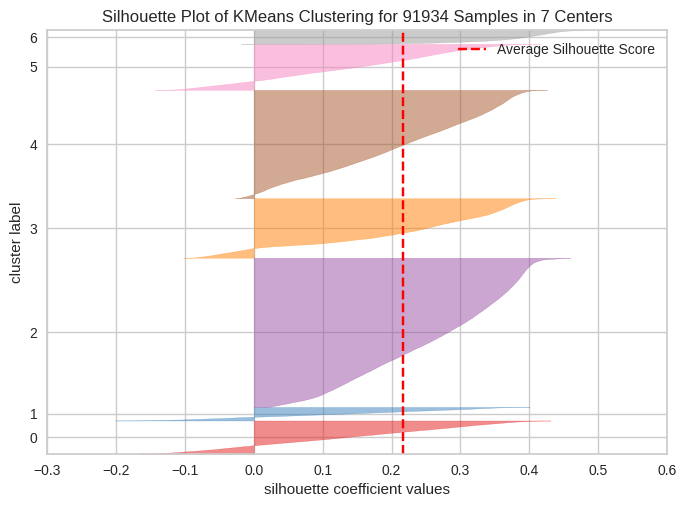

In [33]:
from yellowbrick.cluster import SilhouetteVisualizer

for n_clusters in range(3, 8):
     
    kmeans = KMeans(n_clusters=n_clusters, init='k-means++', random_state=123) 
    visualizer = SilhouetteVisualizer(kmeans)
    visualizer.fit(df_transformed)
    visualizer.show()

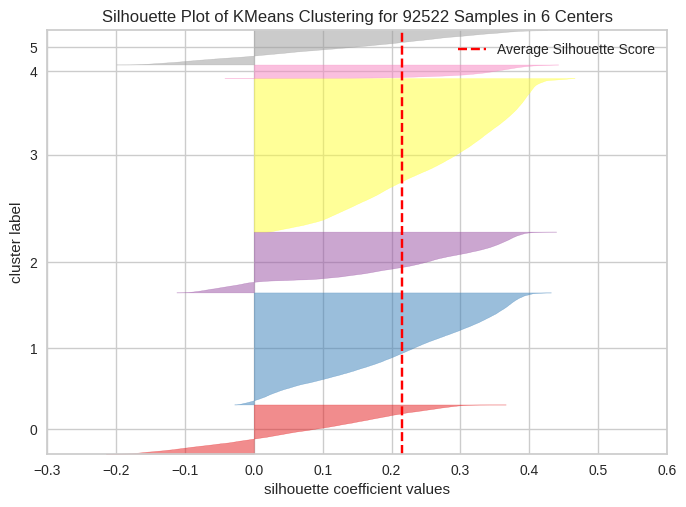

In [72]:
from yellowbrick.cluster import SilhouetteVisualizer
     
kmeans = KMeans(n_clusters=6, init='k-means++', random_state=123) 
visualizer = SilhouetteVisualizer(kmeans)
visualizer.fit(df_transformed)
visualizer.show()

### K = 6

In [55]:
kmeans = KMeans(n_clusters=6, init='k-means++', random_state=123).fit(df_transformed)
pred = kmeans.predict(df_transformed)
df['cluster'] = pred

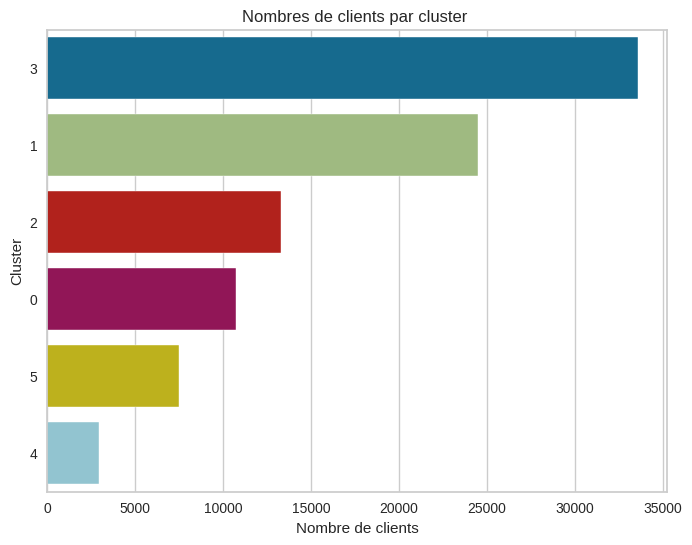

In [57]:
plt.subplots(figsize = (8,6))
cluster = df["cluster"]
ax = sns.countplot(y=cluster, order=cluster.value_counts().index)
plt.title("Nombres de clients par cluster ")
plt.xlabel("Nombre de clients")
plt.ylabel("Cluster")
plt.show()

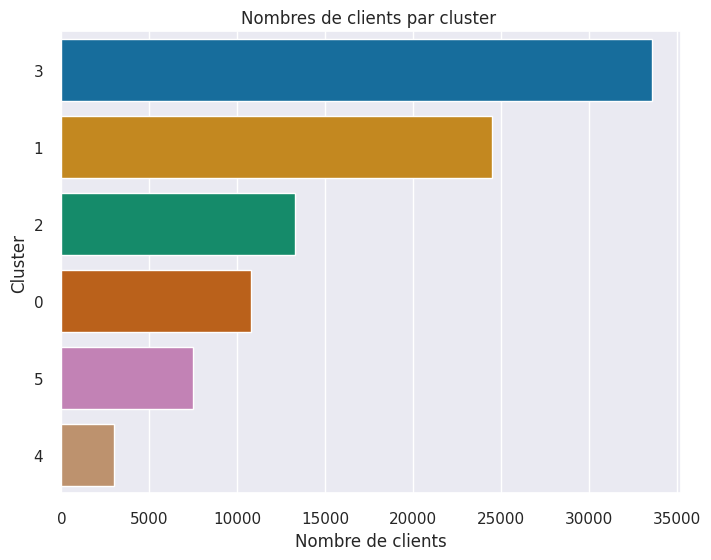

In [193]:
plt.subplots(figsize = (8,6))
cluster = df["cluster"]
ax = sns.countplot(y=cluster, order=cluster.value_counts().index)
plt.title("Nombres de clients par cluster ")
plt.xlabel("Nombre de clients")
plt.ylabel("Cluster")
plt.show()

### Visualisation des distributions des variables par cluster :

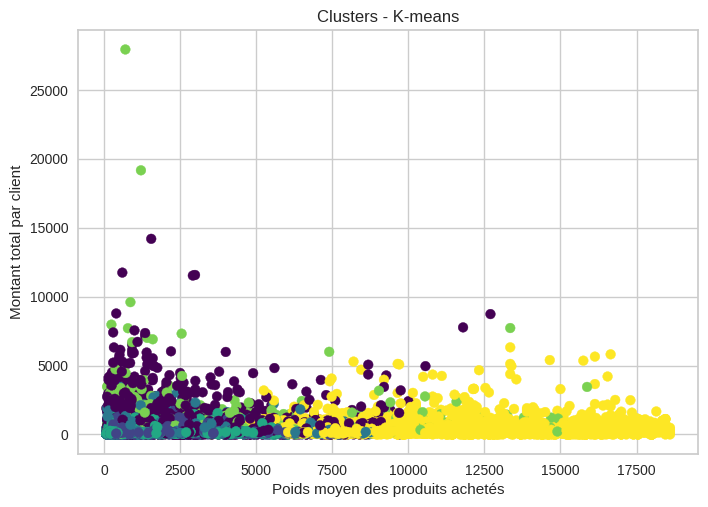

In [60]:
plt.scatter(df['product_weight_g'], df['montant_total'], c=pred, cmap = 'viridis')
plt.title('Clusters - K-means')
plt.xlabel('Poids moyen des produits achetés')
plt.ylabel('Montant total par client')
plt.show()

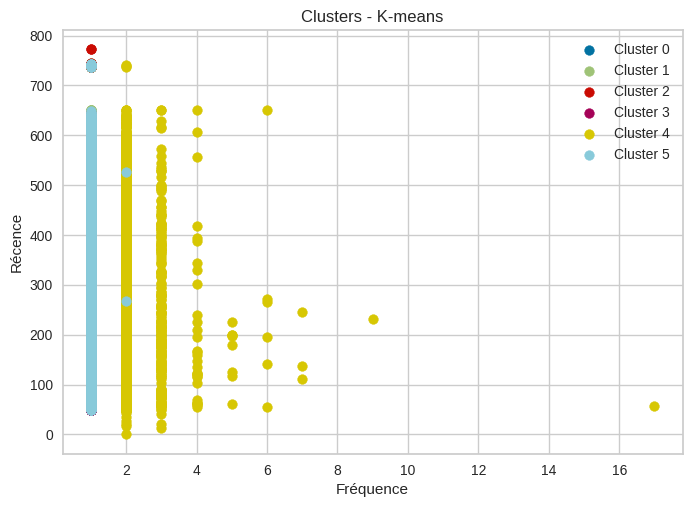

In [59]:
for cluster_num in set(pred):
    plt.scatter(df.loc[pred == cluster_num, 'frequence'], df.loc[pred == cluster_num, 'recence'], 
                label=f'Cluster {cluster_num}')
plt.title('Clusters - K-means')
plt.xlabel('Fréquence')
plt.ylabel('Récence')
plt.legend()
plt.show()

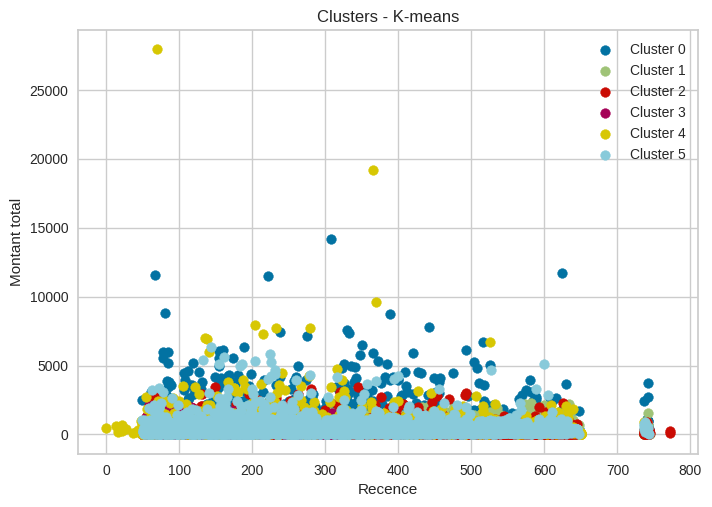

In [61]:
for cluster_num in set(pred):
    plt.scatter(df.loc[pred == cluster_num, 'recence'], df.loc[pred == cluster_num, 'montant_total'], 
                label=f'Cluster {cluster_num}')

plt.title('Clusters - K-means')
plt.xlabel('Recence')
plt.ylabel('Montant total')
plt.legend()
plt.show()


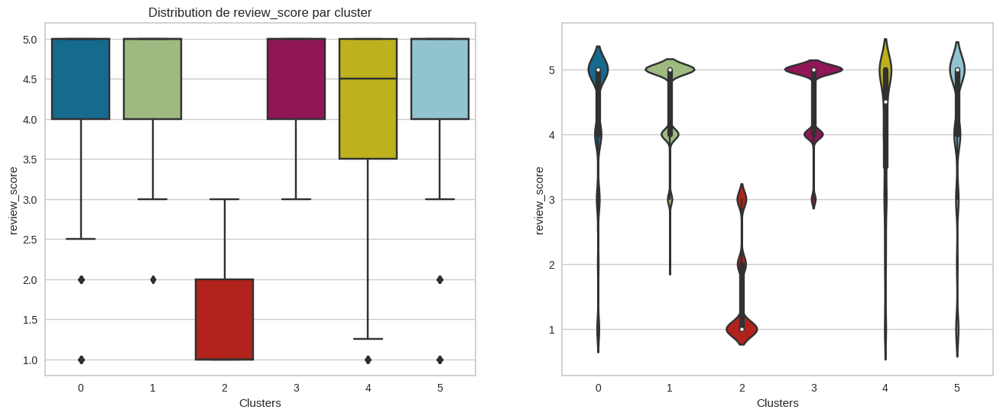

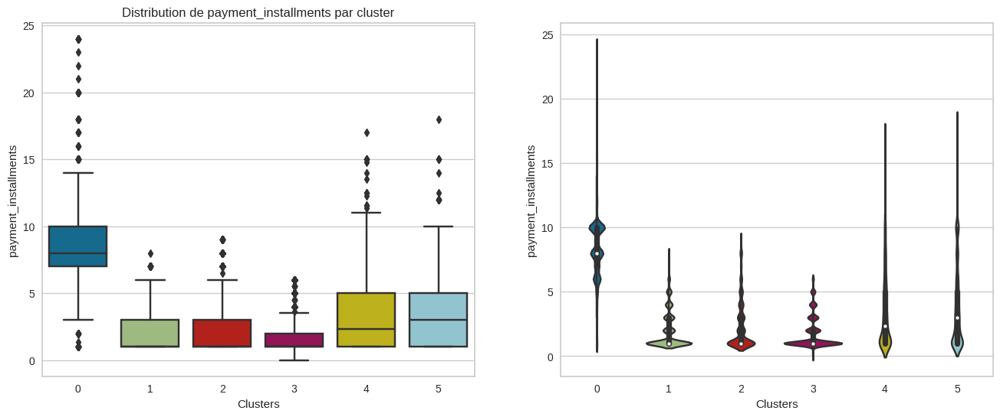

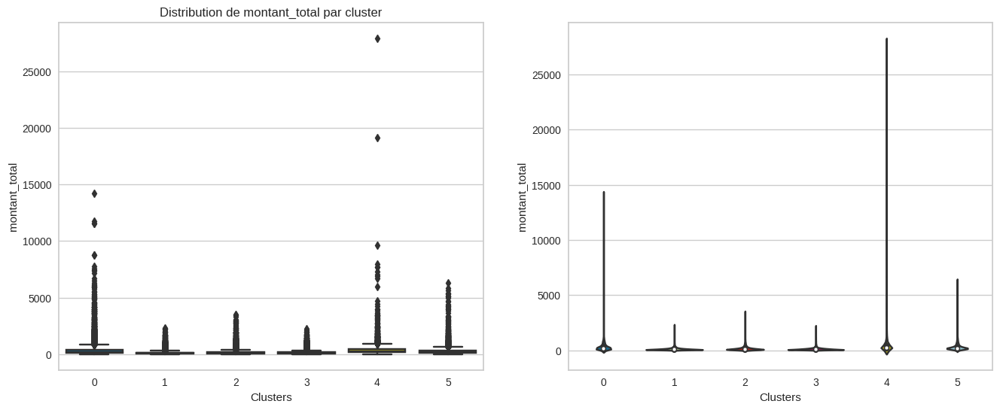

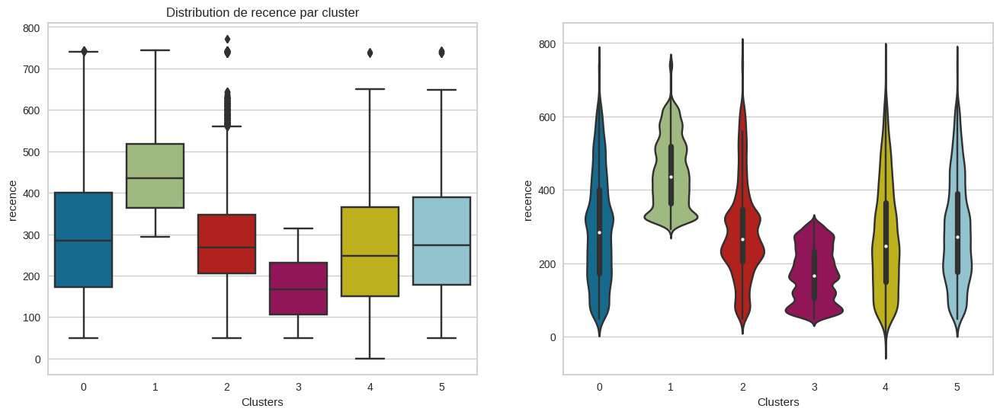

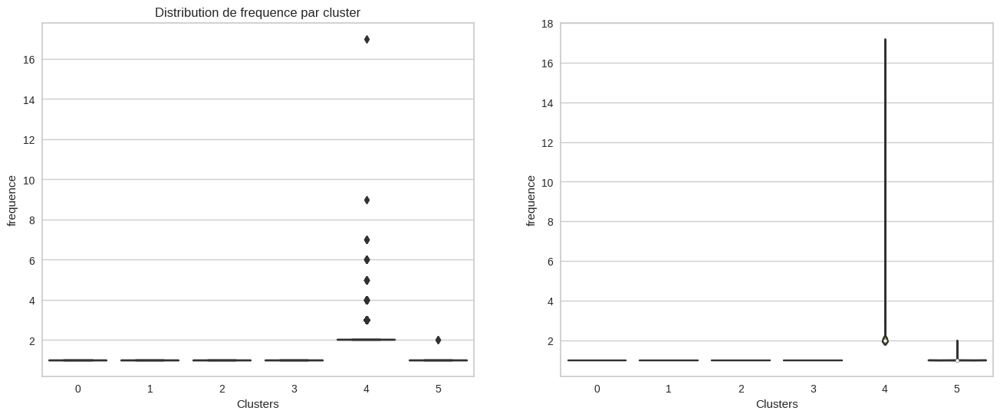

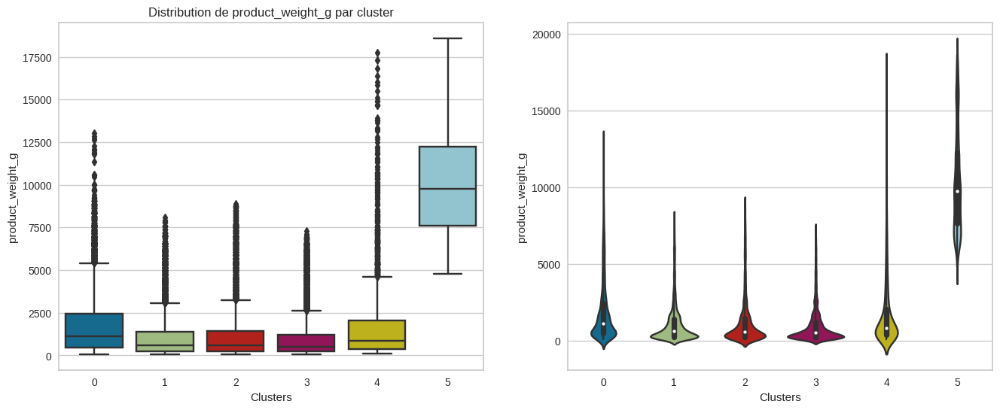

In [62]:
col_plot = ['review_score', 'payment_installments', 'montant_total', 'recence', 'frequence', 'product_weight_g']
for col in col_plot:
    fig, ax = plt.subplots(1, 2, figsize=(16,6))
    sns.boxplot(data=df, x='cluster', y=col, ax=ax[0]) 
    titre_1 = "Distribution de " + col + " par cluster"
    ax[0].set_title(titre_1)
    ax[0].set_xlabel("Clusters")
    ax[0].set_ylabel(col)
    
    sns.violinplot(data = df, x='cluster', y = col, ax = ax[1] )
    
    ax[1].set_xlabel("Clusters")

    
    plt.show()

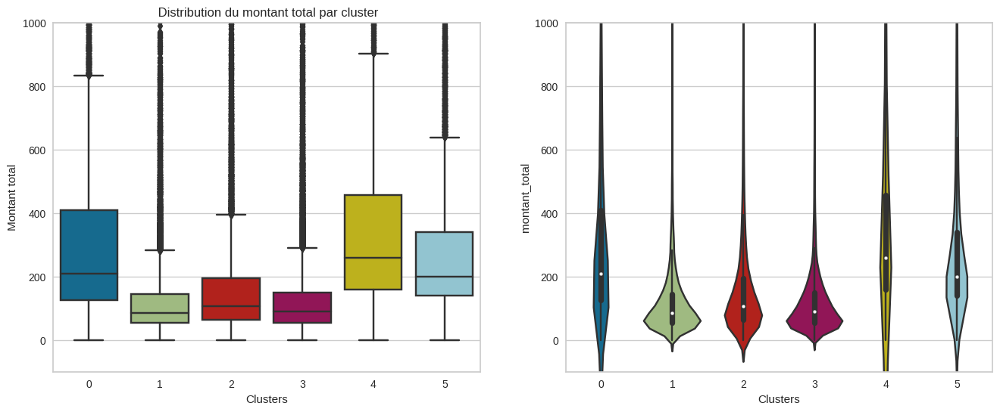

In [97]:
# Zoom sur le montant toal
fig, ax = plt.subplots(1, 2, figsize=(16,6))
sns.boxplot(data=df, x='cluster', y='montant_total', ax=ax[0]) 
ax[0].set_title(f' Distribution du montant total par cluster')
ax[0].set_xlabel("Clusters")
ax[0].set_ylabel("Montant total")
ax[0].set_ylim(-100, 1e3)

sns.violinplot(data = df, x='cluster', y = 'montant_total', ax = ax[1] )
ax[1].set_xlabel("Clusters")
ax[1].set_ylim(-100, 1e3)

plt.show()

In [98]:
# aggréger les données par cluster, calcul de la somme des variables
agg_dict = {
    'product_category_name': lambda x: x.mode().iloc[0] if not x.empty else 'unknown',
    'product_weight_g': 'sum',
    'review_score': 'sum', # score moyen
    'payment_installments': 'sum',
    'montant_total': 'sum',
    'recence' : 'sum',
    'frequence': 'sum'
}
df_sum = df.groupby('cluster', as_index=True).agg(agg_dict)

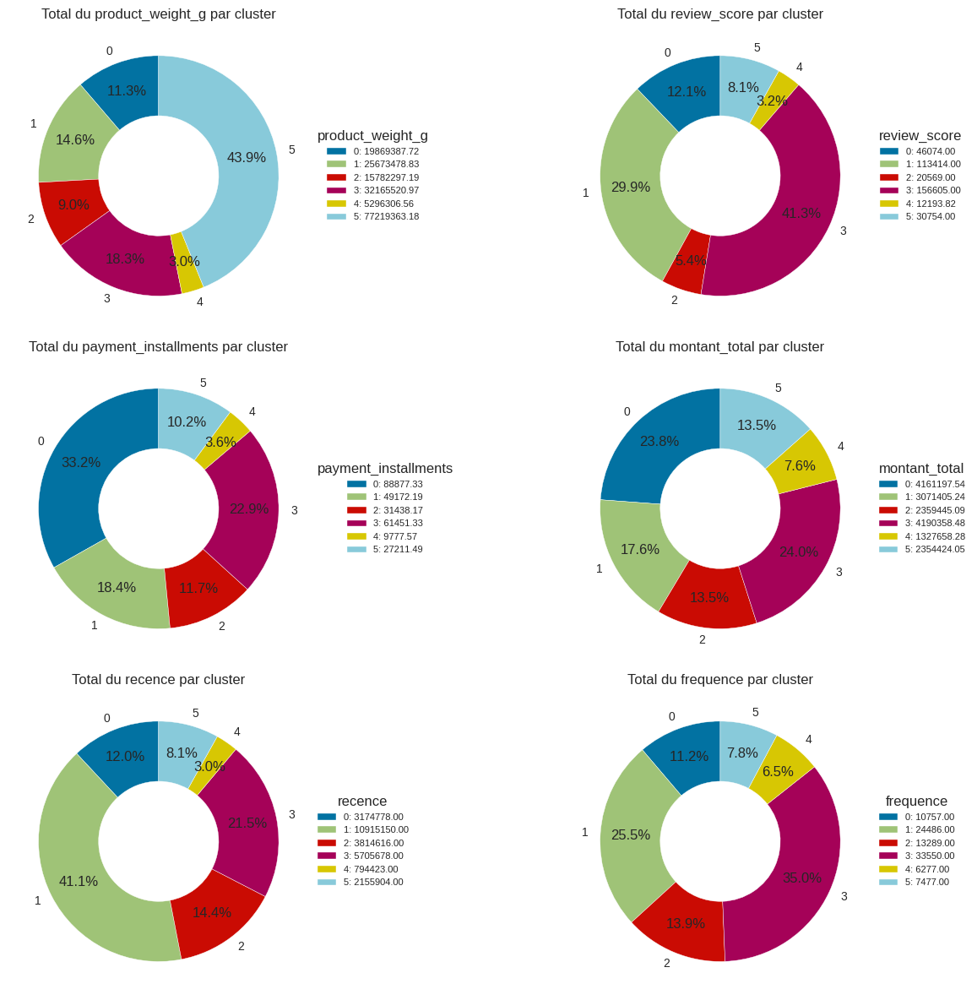

In [99]:
# means_by_cluster = df.groupby('cluster').mean()

# Création d'un diagramme circulaire avec légende pour chaque variable
fig, axes = plt.subplots(3, 2, figsize=(14, 12))

for i, column in enumerate(df.columns[1:-1]):  # Exclure la colonne 'cluster' et product_category_name
    ax = axes[i // 2, i % 2]
    wedges, texts, autotexts = ax.pie(df_sum[column], labels=df_sum.index,
                                      autopct='%1.1f%%', startangle=90, wedgeprops=dict(width=0.5),
                                     pctdistance = 0.75)
    ax.set_title(f'Total du {column} par cluster')

    # Création d'une légende à côté du diagramme circulaire
    legend_labels = [f'{cluster}: {mean:.2f}' for cluster, mean in zip(df_sum.index, df_sum[column])]
    ax.legend(wedges, legend_labels, title=f'{column}', bbox_to_anchor=(1, 0.5), loc="center left", fontsize=8)

plt.tight_layout()
plt.show()

In [110]:
# Aggréger les données par cluster - en calculant la moyenne de chaque variable
agg_dict = {
    'product_category_name': lambda x: x.mode().iloc[0] if not x.empty else 'unknown',
    'product_weight_g': 'mean',
    'review_score': 'mean', # score moyen
    'payment_installments': 'mean',
    'montant_total': 'mean',
    'recence' : 'mean',
    'frequence': 'mean'
}
df_mean = df.groupby('cluster', as_index=True).agg(agg_dict)

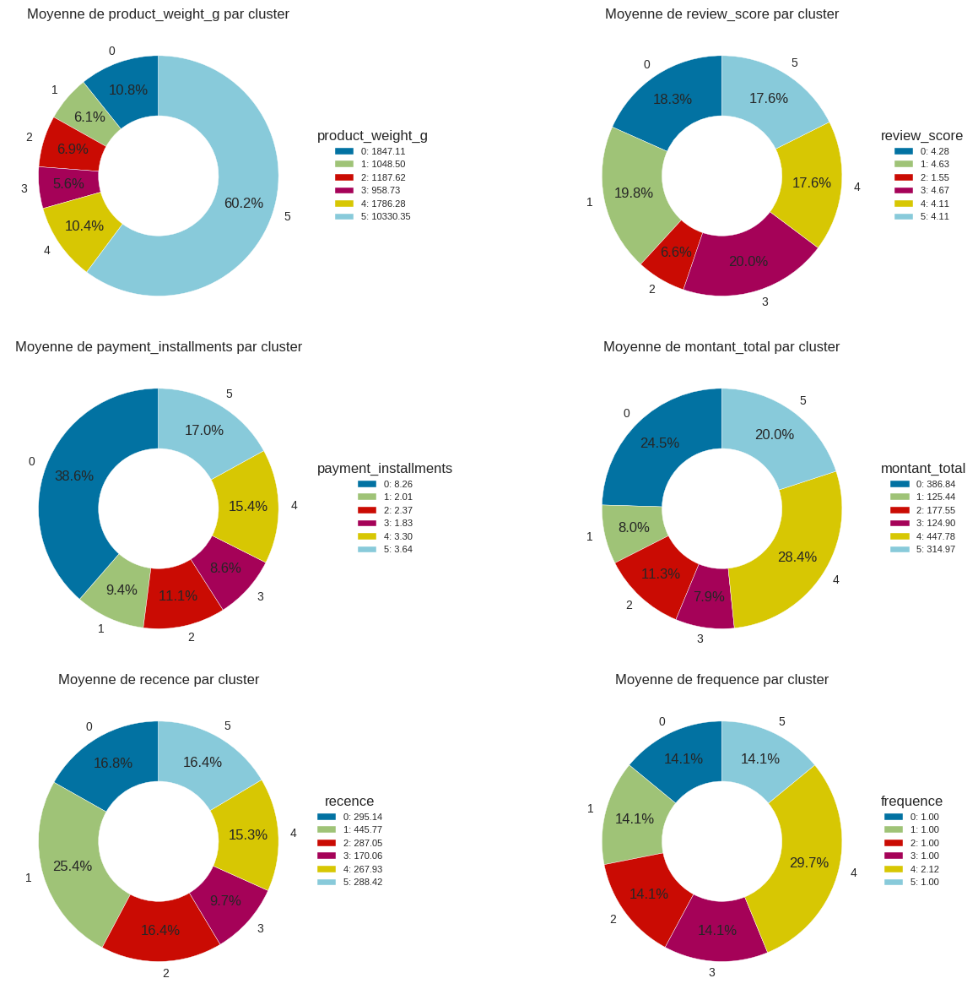

In [111]:
# Création d'un diagramme circulaire avec légende pour chaque variable
fig, axes = plt.subplots(3, 2, figsize=(14, 12))

for i, column in enumerate(df.columns[1:-1]):  # Exclure la colonne 'cluster'
    ax = axes[i // 2, i % 2]
    wedges, texts, autotexts = ax.pie(df_mean[column], labels=df_mean.index,
                                      autopct='%1.1f%%', startangle=90, wedgeprops=dict(width=0.5),
                                     pctdistance = 0.75)
    ax.set_title(f'Moyenne de {column} par cluster')

    # Création d'une légende à côté du diagramme circulaire
    legend_labels = [f'{cluster}: {mean:.2f}' for cluster, mean in zip(df_mean.index, df_mean[column])]
    ax.legend(wedges, legend_labels, title=f'{column}', bbox_to_anchor=(1, 0.5), loc="center left", fontsize=8)

plt.tight_layout()
plt.show()

### Interprétation des clusters :

   - Cluster 5 : Clients dépensiers, achetent des articles lourds
   - Cluster 4 : Clients plus fréquents, plus dépensiers
   - Cluster 3 : Clients plus récents, étalent le moins le paiement, très satisfaits
   - Cluster 2 : Clients mécontents, petites dépenses 
   - Cluster 1 : Clients plus anciens, très satisfaits
   - Cluster 0 : Clients dépensiers et étalent le plus le paiement

In [191]:
df.cluster.value_counts()

3    33550
1    24486
2    13289
0    10757
5     7475
4     2965
Name: cluster, dtype: int64

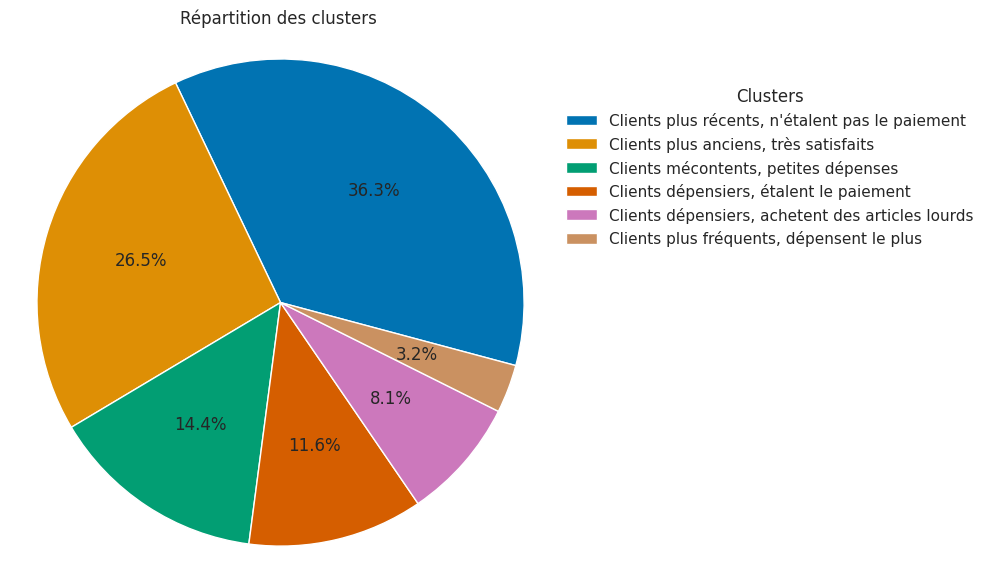

In [192]:
plt.figure(figsize=(7, 7))
cluster_labels = ["Clients plus récents, n'étalent pas le paiement",
                  'Clients plus anciens, très satisfaits',
                  'Clients mécontents, petites dépenses', 
                  'Clients dépensiers, étalent le paiement', 
                  'Clients dépensiers, achetent des articles lourds',
                  'Clients plus fréquents, dépensent le plus'
                 ]
wedges, texts, autotexts = plt.pie(df['cluster'].value_counts(),
                                   autopct='%1.1f%%', 
                                   startangle=345, 
                                   wedgeprops={'linewidth': 1, 'edgecolor': 'white'})
plt.axis('equal') 
plt.title('Répartition des clusters ')


# Ajout d'une légende avec les dépenses totales
legend_labels = [f'{label}' for label in cluster_labels]
plt.legend(wedges, legend_labels, title='Clusters', loc='center left', bbox_to_anchor=(1, 0.75))

plt.show()

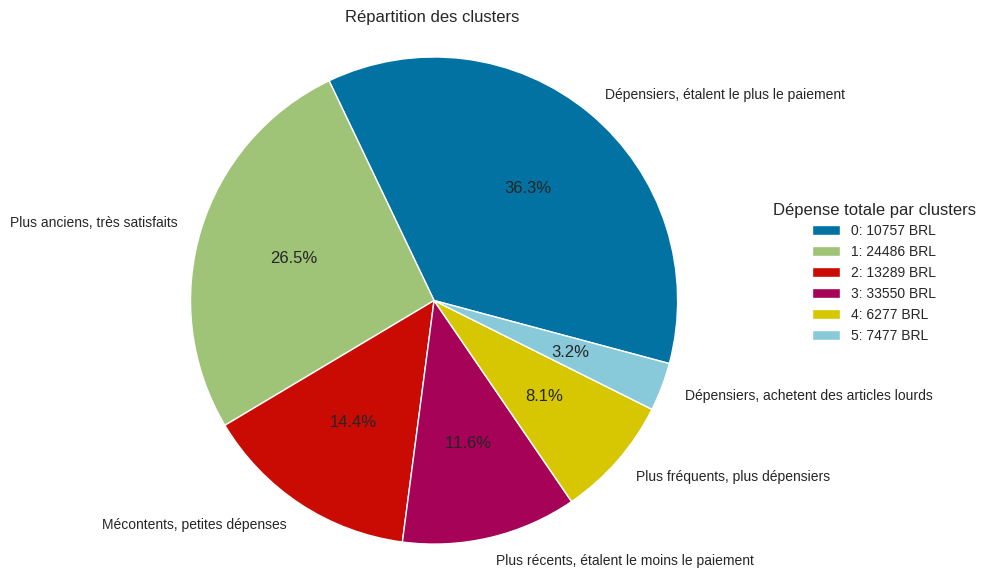

In [108]:
plt.figure(figsize=(7, 7))
cluster_labels =  ['Dépensiers, étalent le plus le paiement', 
                  'Plus anciens, très satisfaits', 
                  'Mécontents, petites dépenses', 
                  'Plus récents, étalent le moins le paiement', 
                  'Plus fréquents, plus dépensiers',
                  'Dépensiers, achetent des articles lourds']
wedges, texts, autotexts = plt.pie(df['cluster'].value_counts(),
                                   autopct='%1.1f%%', 
                                   labels=cluster_labels,
                                   startangle=345, 
                                   wedgeprops={'linewidth': 1, 'edgecolor': 'white'})
plt.axis('equal') 
plt.title('Répartition des clusters ')


# Ajout d'une légende avec les dépenses totales
legend_labels = [f'{cluster}: {mean:} BRL' for cluster, mean in zip(df_sum.index, df_sum[column])]
plt.legend(wedges, legend_labels, title='Dépense totale par clusters', loc='center left', bbox_to_anchor=(1.1, 0.55))

plt.show()

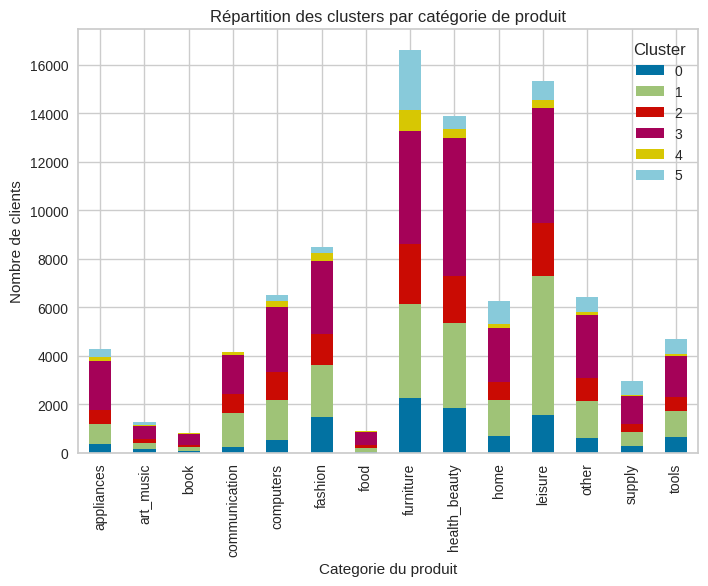

In [105]:
# Visualisation de la répartition des clusters par category_name

category_note = pd.crosstab(df['product_category_name'], df['cluster'])

category_note.plot(kind='bar', stacked=True)
plt.xlabel('Categorie du produit')
plt.ylabel('Nombre de clients')
plt.title('Répartition des clusters par catégorie de produit')
plt.legend(title='Cluster')
plt.show()

Le variable product_category_name ne semble pas pertinente pour le clustering. Nous n'allons pas l'inclure dans les prochains tests

### Test n°2 : Kmeans++

In [71]:
# Sélection des variables :

cols_cluster = ['review_score', 'payment_installments', 'mean_order_price', 'recence']
df_2 = data[cols_cluster]
df_2.head(2)

,review_score,payment_installments,mean_order_price,recence
0,5.0,8.0,141.90,160
1,4.0,1.0,27.19,163


In [72]:
df_2.drop_duplicates(inplace=True)
df_2.dropna(inplace=True)
df_2 = df_2.reset_index(drop=True)
df_2.shape

(93765, 4)

In [73]:
# Standardisation des données

scaler = StandardScaler()
df_2_scaled = scaler.fit_transform(df_2)

df_2_scaled = pd.DataFrame(df_2_scaled, columns=df_2.columns)
df_2_scaled.head(2)

,review_score,payment_installments,mean_order_price,recence
0,0.684244,1.927699,-0.030927,-0.832181
1,-0.061440,-0.711320,-0.819572,-0.812636


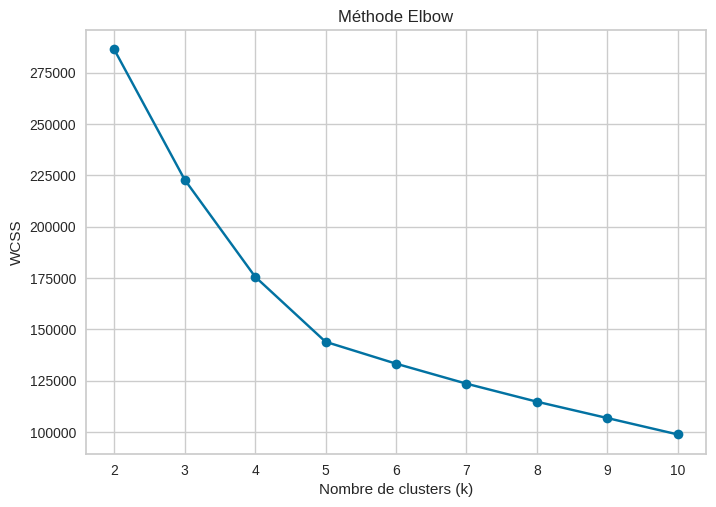

In [74]:
from sklearn.cluster import KMeans
import warnings
warnings.filterwarnings("ignore")


wcss = []  # Liste pour stocker les valeurs de WCSS -somme des carrés des distances intra-cluster

for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=21)
    kmeans.fit(df_2_scaled)
    wcss.append(kmeans.inertia_)  

# Tracer le graphique du coude
plt.plot(range(2, 11), wcss, marker='o')
plt.title('Méthode Elbow')
plt.xlabel('Nombre de clusters (k)')
plt.ylabel('WCSS')
plt.show()

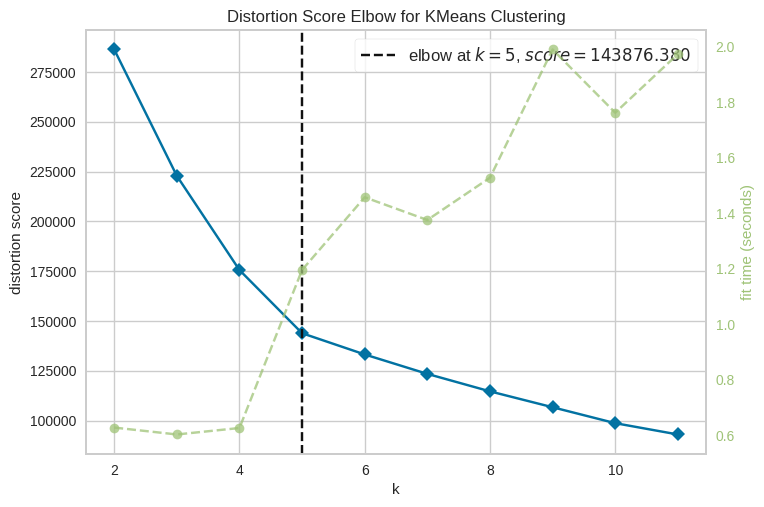

In [75]:
from yellowbrick.cluster import KElbowVisualizer


# Instantiate the clustering model and visualizer
model = KMeans(init='k-means++', random_state=21)
visualizer = KElbowVisualizer(model, k=(2,12))

visualizer.fit(df_2_scaled)        
visualizer.show() 

Le nombre de cluster optimal est 5

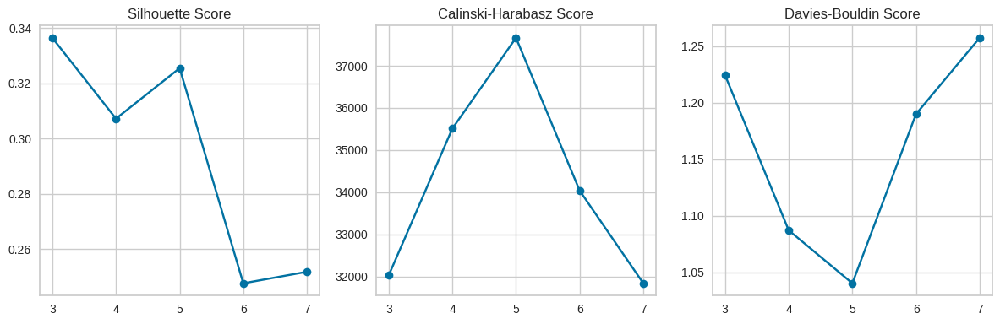

In [78]:
# Liste pour stocker les métriques
silhouette_scores = []
calinski_scores = []
davies_bouldin_scores = []

# Nombre de clusters à tester
for n_clusters in range(3, 8):
     # Appliquer K-means
    kmeans = KMeans(n_clusters=n_clusters, init='k-means++', random_state=21)
    labels = kmeans.fit_predict(df_2_scaled)
    # Calculer les métriques
    silhouette_scores.append(silhouette_score(df_2_scaled, labels))
    calinski_scores.append(calinski_harabasz_score(df_2_scaled, labels))
    davies_bouldin_scores.append(davies_bouldin_score(df_2_scaled, labels))

# Tracer les métriques
plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.plot(range(3, 8), silhouette_scores, marker='o')
plt.title('Silhouette Score')

plt.subplot(1, 3, 2)
plt.plot(range(3, 8), calinski_scores, marker='o')
plt.title('Calinski-Harabasz Score')

plt.subplot(1, 3, 3)
plt.plot(range(3, 8), davies_bouldin_scores, marker='o')
plt.title('Davies-Bouldin Score')

plt.tight_layout()
plt.show()

In [77]:
silhouette_scores

[0.33644074780702143,
 0.30718220822404035,
 0.32546584513595406,
 0.24758035217359498,
 0.2517493243285001]

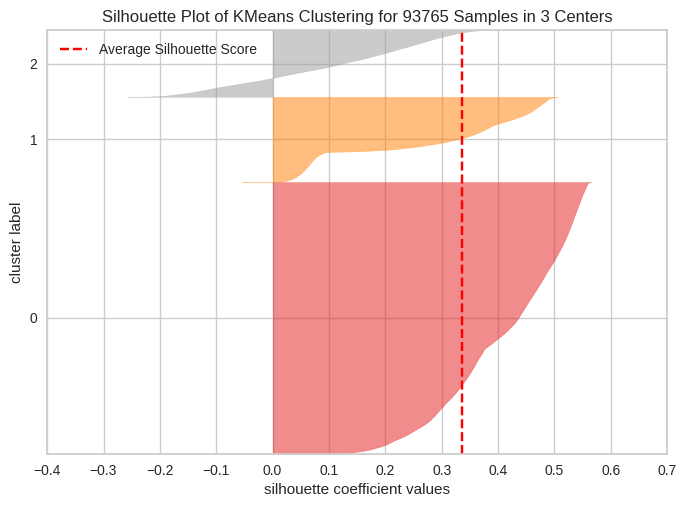

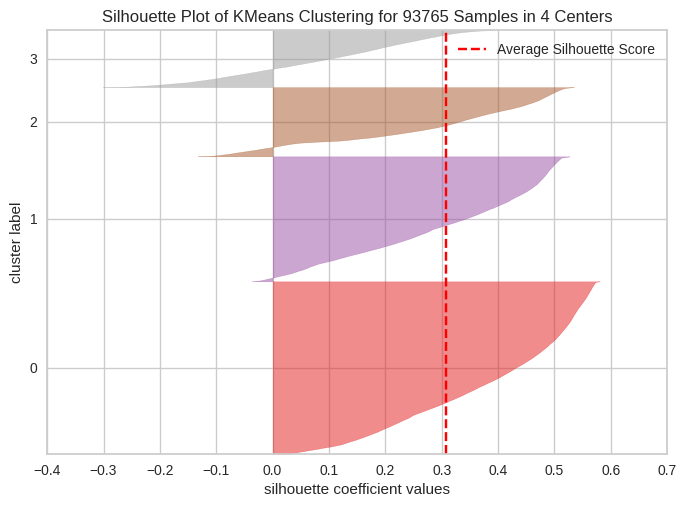

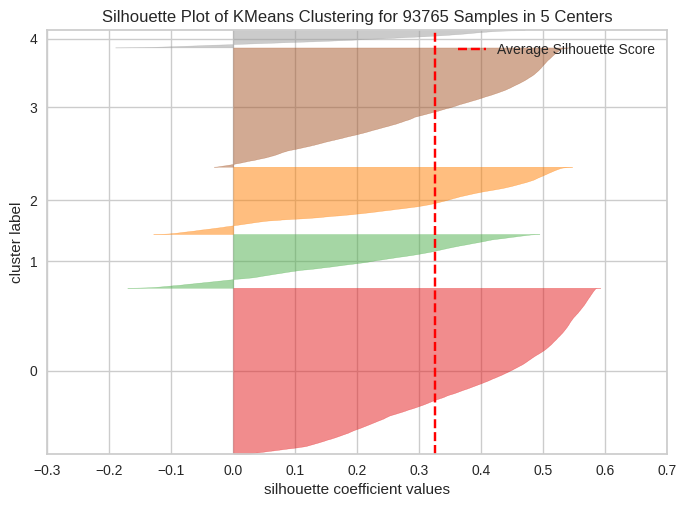

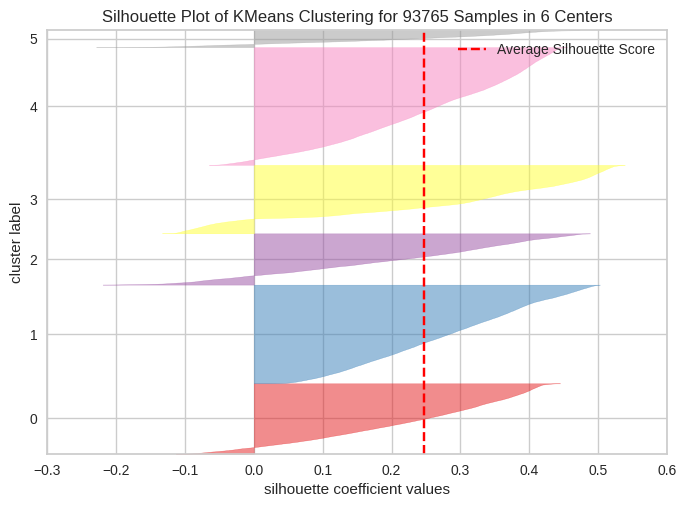

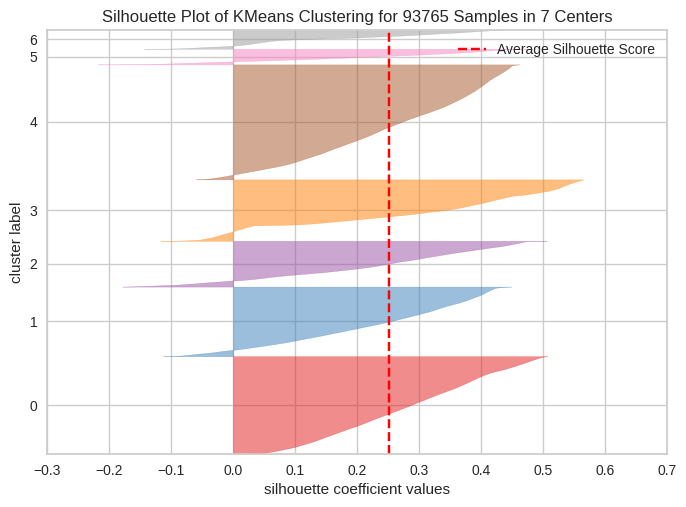

In [79]:
for n_clusters in range(3, 8):
     
    kmeans = KMeans(n_clusters=n_clusters, init='k-means++', random_state=21) 
    visualizer = SilhouetteVisualizer(kmeans)
    visualizer.fit(df_2_scaled)
    visualizer.show()

### K = 5

In [80]:
kmeans = KMeans(n_clusters=5, init='k-means++', random_state=21).fit(df_2_scaled)
pred = kmeans.predict(df_2_scaled)
df_2['cluster'] = pred

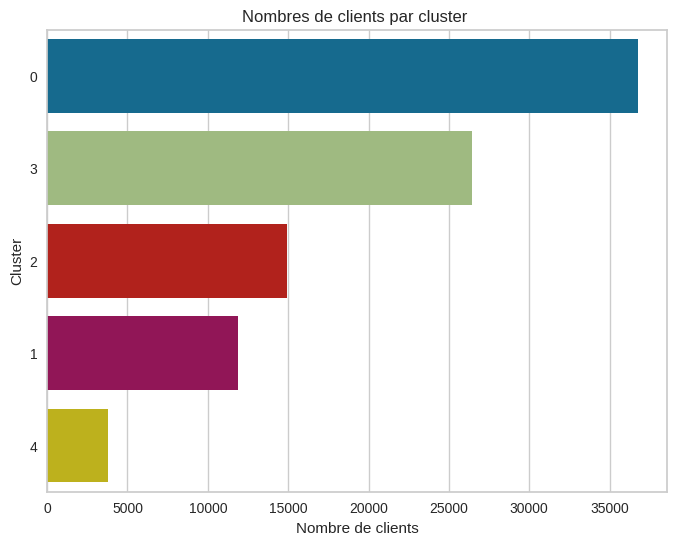

In [81]:
plt.subplots(figsize = (8,6))
cluster = df_2["cluster"]
ax = sns.countplot(y=cluster, order=cluster.value_counts().index)
plt.title("Nombres de clients par cluster ")
plt.xlabel("Nombre de clients")
plt.ylabel("Cluster")
plt.show()

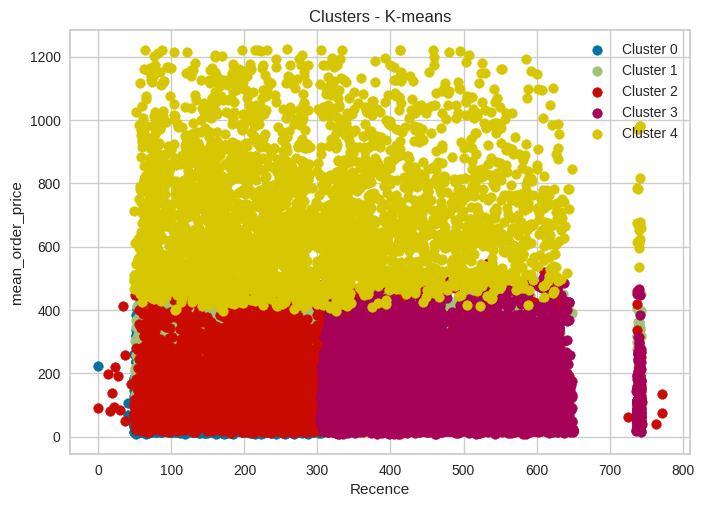

In [83]:
for cluster_num in set(pred):
    plt.scatter(df_2.loc[pred == cluster_num, 'recence'], df_2.loc[pred == cluster_num, 'mean_order_price'], 
                label=f'Cluster {cluster_num}')

plt.title('Clusters - K-means')
plt.xlabel('Recence')
plt.ylabel('mean_order_price')
plt.legend()
plt.show()


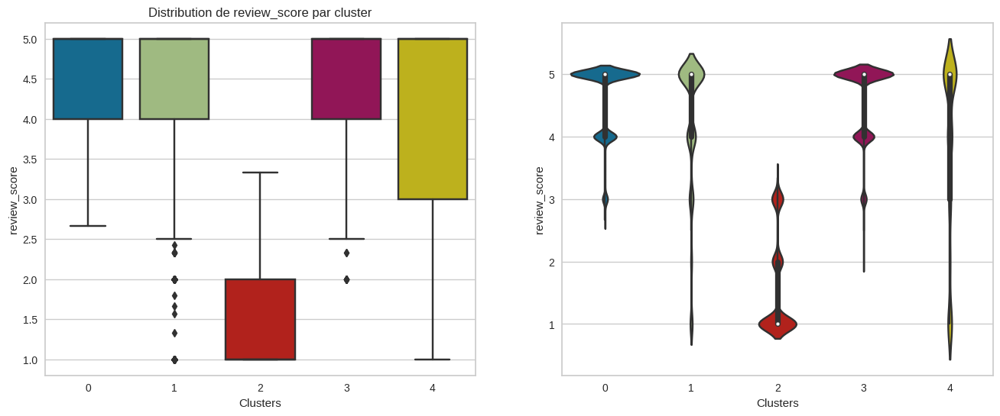

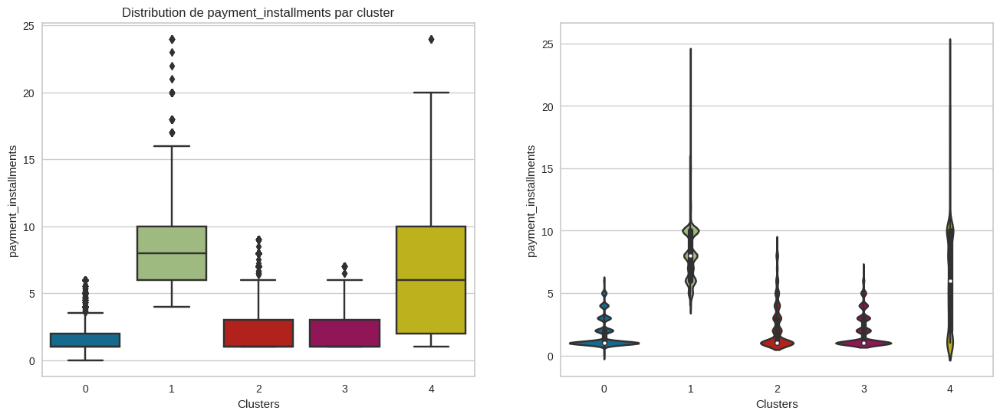

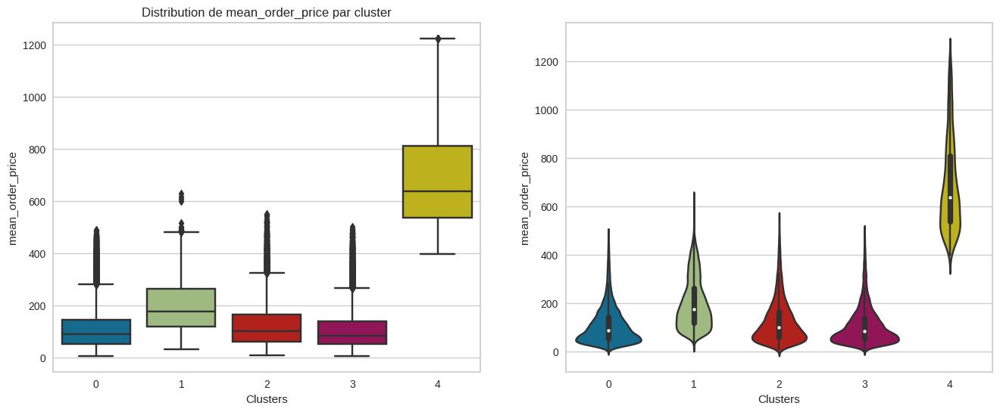

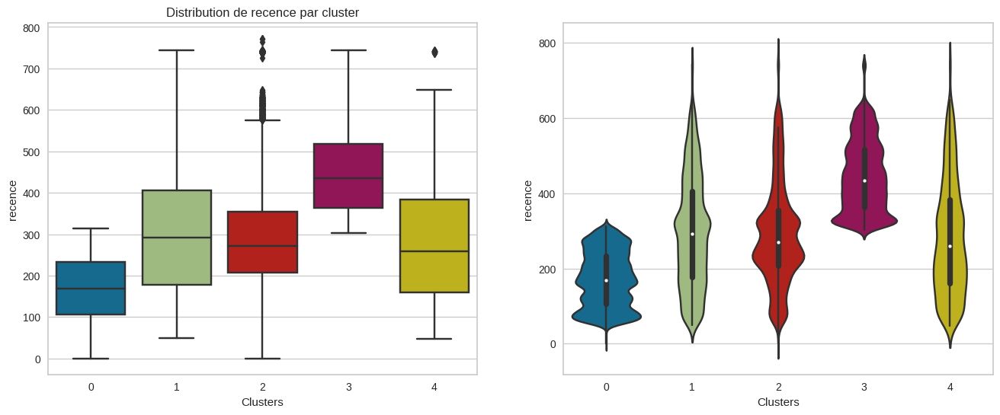

In [84]:
for col in cols_cluster:
    fig, ax = plt.subplots(1, 2, figsize=(16,6))
    sns.boxplot(data=df_2, x='cluster', y=col, ax=ax[0]) 
    titre_1 = "Distribution de " + col + " par cluster"
    ax[0].set_title(titre_1)
    ax[0].set_xlabel("Clusters")
    ax[0].set_ylabel(col)
    
    sns.violinplot(data = df_2, x='cluster', y = col, ax = ax[1] )
    
    ax[1].set_xlabel("Clusters")

    
    plt.show()

### Test n°3 : K-means++

In [85]:
# Sélection des variables :

cols_cluster = ['review_score', 'mean_order_price', 'recence']
df_3 = data[cols_cluster]

df_3.drop_duplicates(inplace=True)
df_3.dropna(inplace=True)
df_3 = df_3.reset_index(drop=True)
df_3.shape

(92687, 3)

In [86]:
# Standardisation des données

scaler = StandardScaler()
df_3_scaled = scaler.fit_transform(df_3)

df_3_scaled = pd.DataFrame(df_3_scaled, columns=df_3.columns)

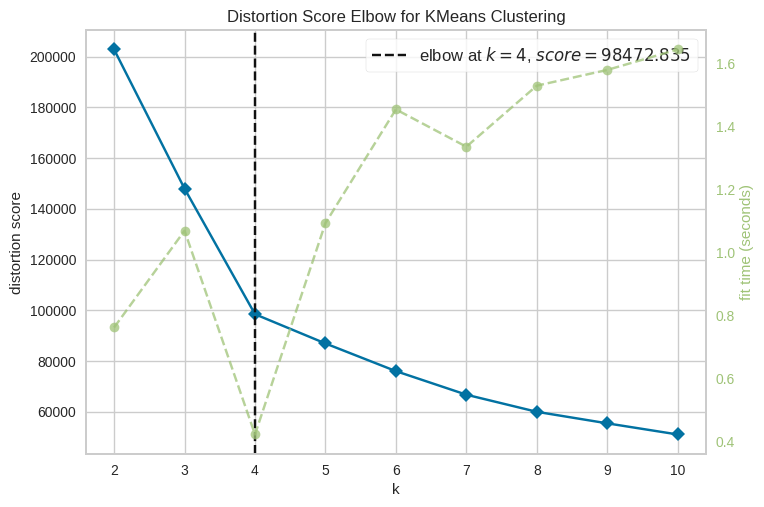

In [87]:
# Instantiate the clustering model and visualizer
model = KMeans(init='k-means++', random_state=21)
visualizer = KElbowVisualizer(model, k=(2,11))

visualizer.fit(df_3_scaled)        
visualizer.show()      

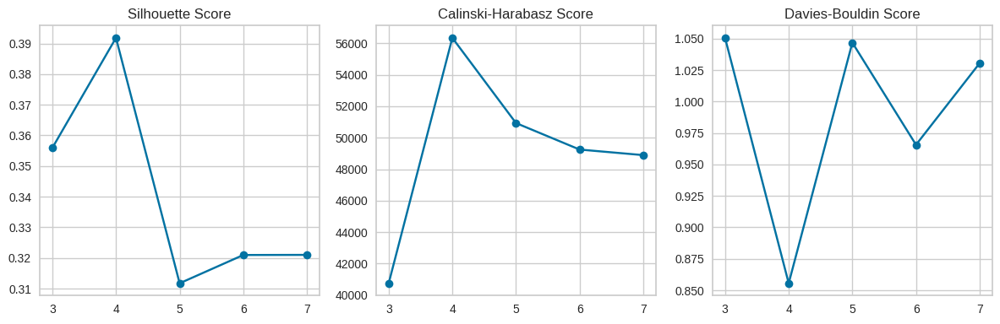

In [88]:
# Liste pour stocker les métriques
silhouette_scores = []
calinski_scores = []
davies_bouldin_scores = []

# Nombre de clusters à tester
for n_clusters in range(3, 8):
     # Appliquer K-means
    kmeans = KMeans(n_clusters=n_clusters, init='k-means++', random_state=21)
    labels = kmeans.fit_predict(df_3_scaled)
    # Calculer les métriques
    silhouette_scores.append(silhouette_score(df_3_scaled, labels))
    calinski_scores.append(calinski_harabasz_score(df_3_scaled, labels))
    davies_bouldin_scores.append(davies_bouldin_score(df_3_scaled, labels))

# Tracer les métriques
plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.plot(range(3, 8), silhouette_scores, marker='o')
plt.title('Silhouette Score')

plt.subplot(1, 3, 2)
plt.plot(range(3, 8), calinski_scores, marker='o')
plt.title('Calinski-Harabasz Score')

plt.subplot(1, 3, 3)
plt.plot(range(3, 8), davies_bouldin_scores, marker='o')
plt.title('Davies-Bouldin Score')

plt.tight_layout()
plt.show()

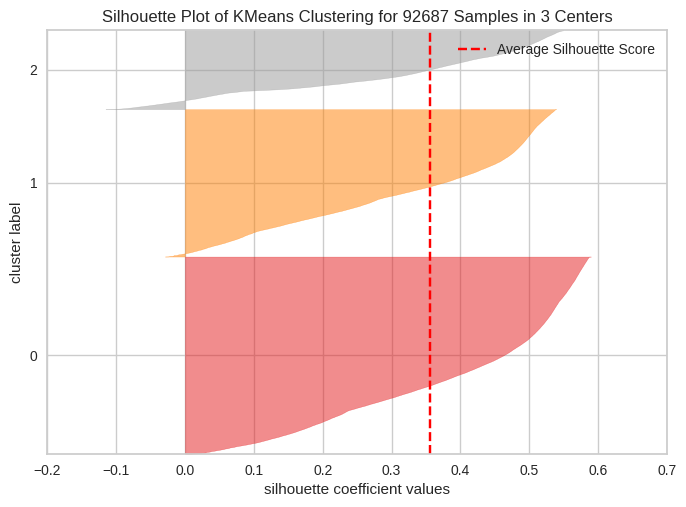

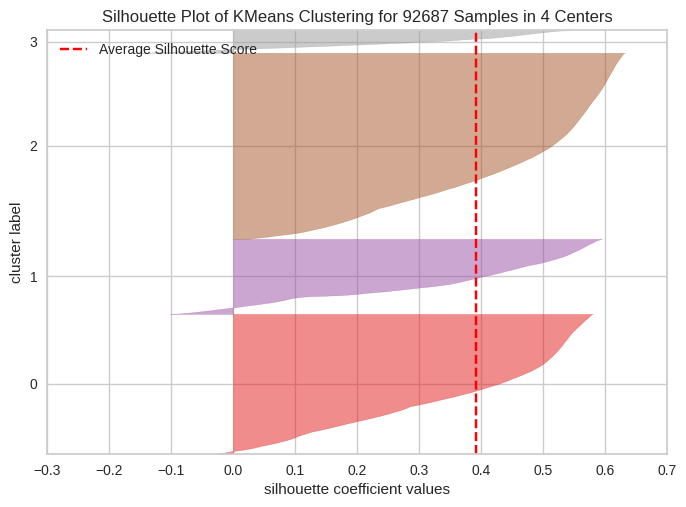

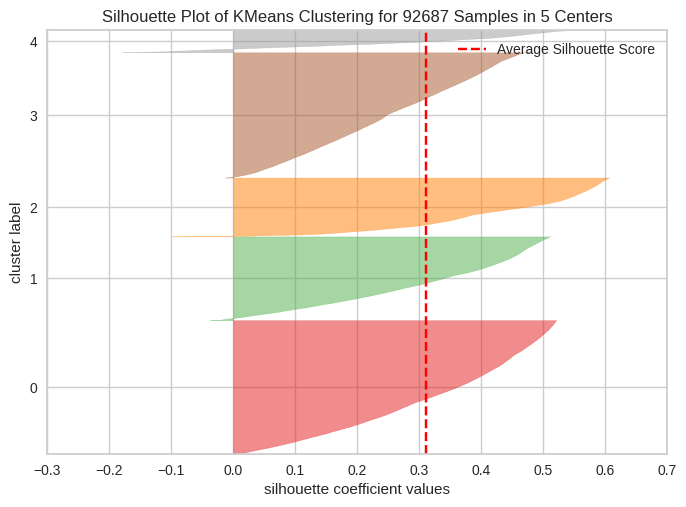

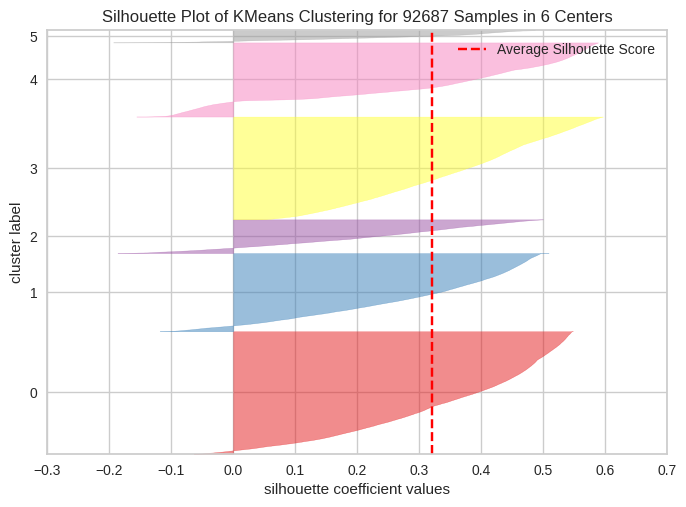

In [90]:
for n_clusters in range(3, 7):
     
    kmeans = KMeans(n_clusters=n_clusters, init='k-means++', random_state=21) 
    visualizer = SilhouetteVisualizer(kmeans)
    visualizer.fit(df_3_scaled)
    visualizer.show()

Le nombre de cluster retenu est 4

In [91]:
kmeans = KMeans(n_clusters=4, init='k-means++', random_state=21).fit(df_3_scaled)
pred = kmeans.predict(df_3_scaled)
df_3['cluster'] = pred

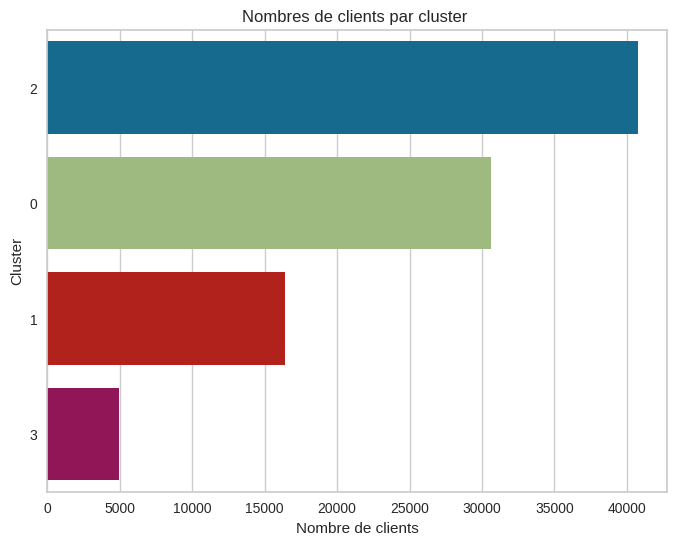

In [92]:
plt.subplots(figsize = (8,6))
cluster = df_3["cluster"]
ax = sns.countplot(y=cluster, order=cluster.value_counts().index)
plt.title("Nombres de clients par cluster ")
plt.xlabel("Nombre de clients")
plt.ylabel("Cluster")
plt.show()

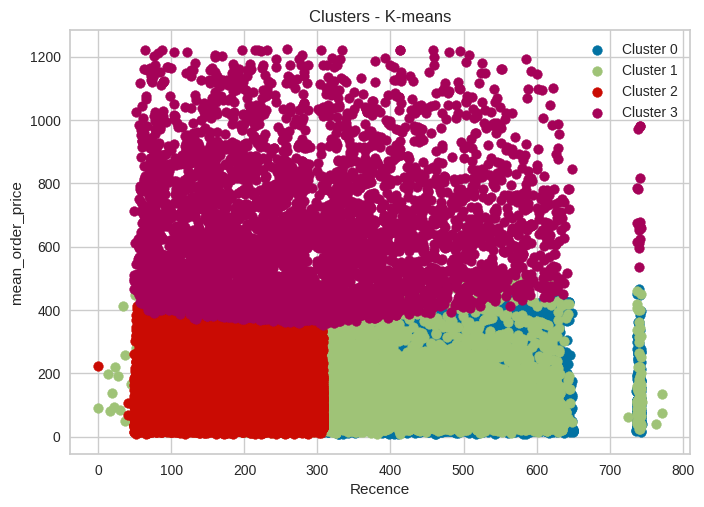

In [93]:
for cluster_num in set(pred):
    plt.scatter(df_3.loc[pred == cluster_num, 'recence'], df_3.loc[pred == cluster_num, 'mean_order_price'], 
                label=f'Cluster {cluster_num}')

plt.title('Clusters - K-means')
plt.xlabel('Recence')
plt.ylabel('mean_order_price')
plt.legend()
plt.show()

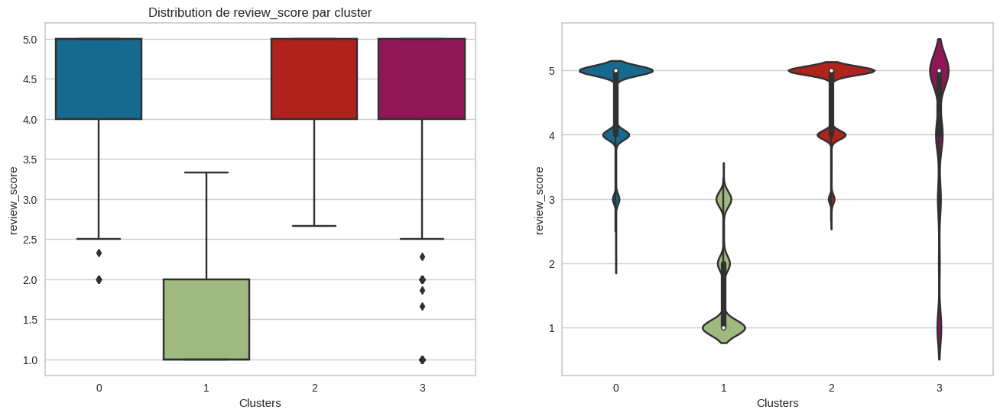

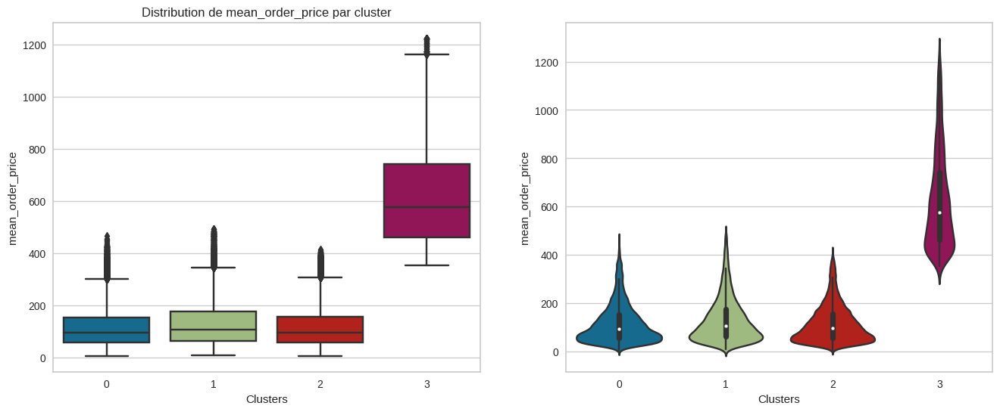

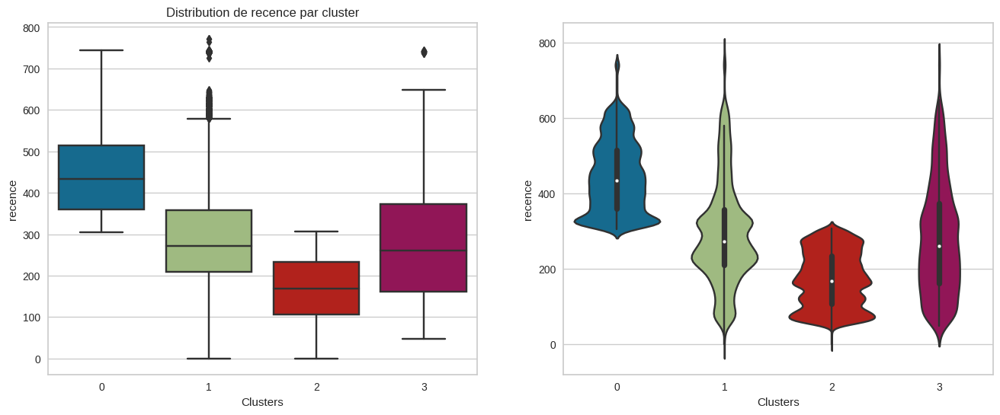

In [94]:
for col in cols_cluster:
    fig, ax = plt.subplots(1, 2, figsize=(16,6))
    sns.boxplot(data=df_3, x='cluster', y=col, ax=ax[0]) 
    titre_1 = "Distribution de " + col + " par cluster"
    ax[0].set_title(titre_1)
    ax[0].set_xlabel("Clusters")
    ax[0].set_ylabel(col)
    sns.violinplot(data = df_3, x='cluster', y = col, ax = ax[1] )
    ax[1].set_xlabel("Clusters")
    plt.show()

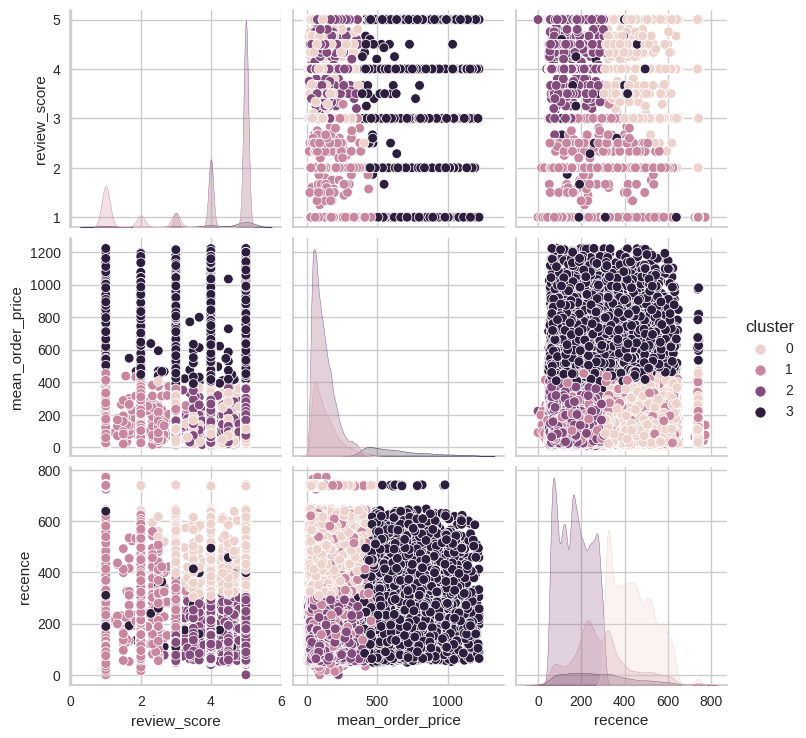

In [95]:
sns.pairplot(df_3, hue='cluster')

### Test n°4 k-means

In [113]:
import warnings
warnings.filterwarnings("ignore")

In [114]:
# Sélection des variables : variables RFM et review_score

cols_cluster = ['review_score', 'montant_total', 'recence', 'frequence']
df_4 = data[cols_cluster]

df_4.drop_duplicates(inplace=True)
df_4.dropna(inplace=True)
df_4 = df_4.reset_index(drop=True)
df_4.shape

(93220, 4)

In [115]:
from sklearn.preprocessing import StandardScaler
# Standardisation des données

scaler = StandardScaler()
df_4_scaled = scaler.fit_transform(df_4)

df_4_scaled = pd.DataFrame(df_4_scaled, columns=df_4.columns)

In [116]:
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer

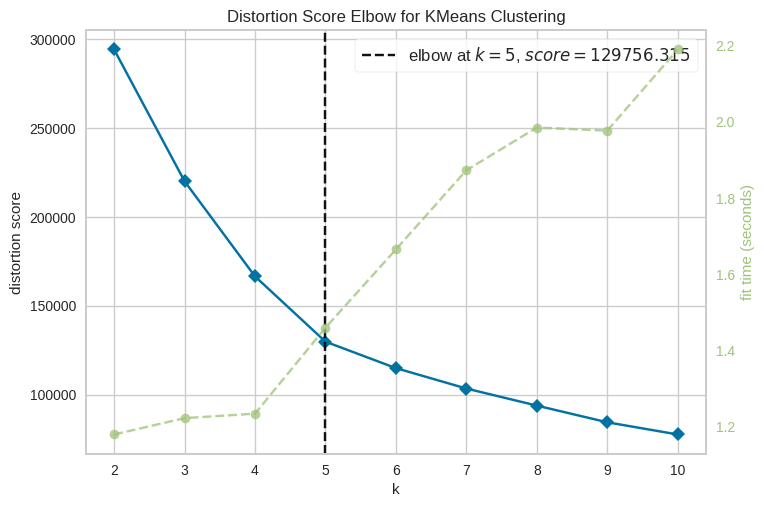

In [117]:
# Instantiate the clustering model and visualizer
model = KMeans(init='k-means++', random_state=21)
visualizer = KElbowVisualizer(model, k=(2,11))

visualizer.fit(df_4_scaled)        
visualizer.show()      

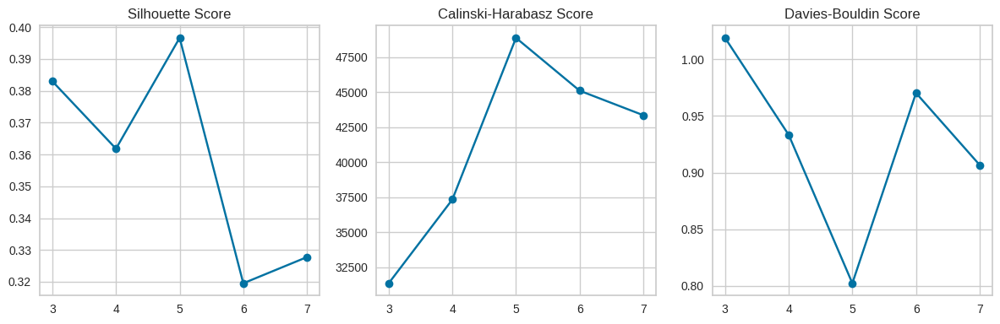

In [99]:
# Liste pour stocker les métriques
silhouette_scores = []
calinski_scores = []
davies_bouldin_scores = []

# Nombre de clusters à tester
for n_clusters in range(3, 8):
     # Appliquer K-means
    kmeans = KMeans(n_clusters=n_clusters, init='k-means++', random_state=21)
    labels = kmeans.fit_predict(df_4_scaled)
    # Calculer les métriques
    silhouette_scores.append(silhouette_score(df_4_scaled, labels))
    calinski_scores.append(calinski_harabasz_score(df_4_scaled, labels))
    davies_bouldin_scores.append(davies_bouldin_score(df_4_scaled, labels))

# Tracer les métriques
plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.plot(range(3, 8), silhouette_scores, marker='o')
plt.title('Silhouette Score')

plt.subplot(1, 3, 2)
plt.plot(range(3, 8), calinski_scores, marker='o')
plt.title('Calinski-Harabasz Score')

plt.subplot(1, 3, 3)
plt.plot(range(3, 8), davies_bouldin_scores, marker='o')
plt.title('Davies-Bouldin Score')

plt.tight_layout()
plt.show()

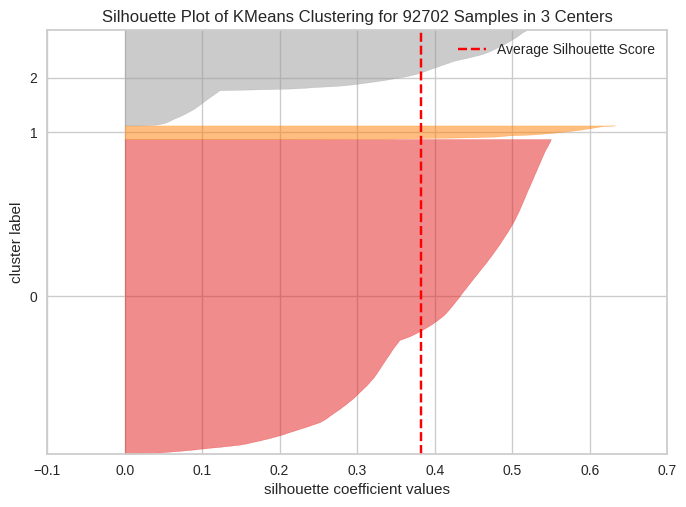

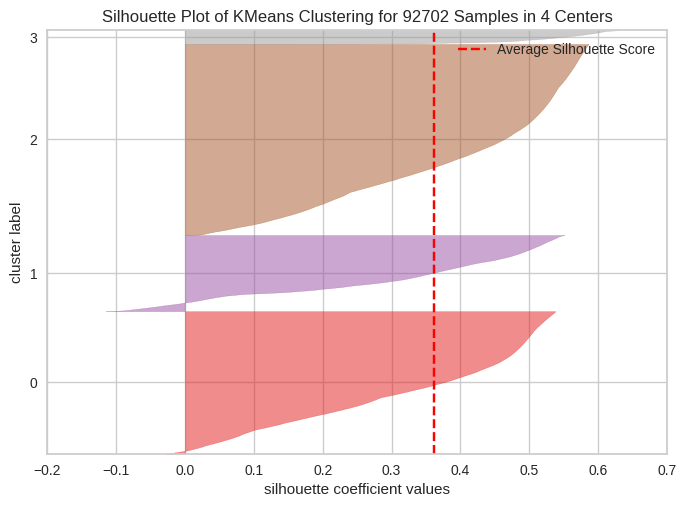

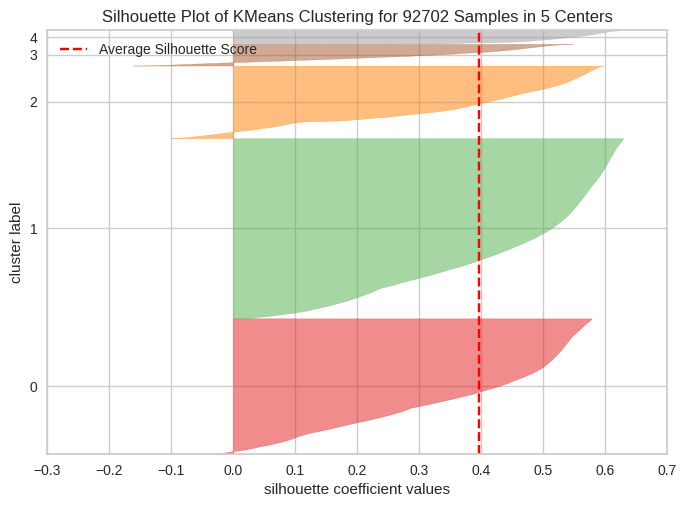

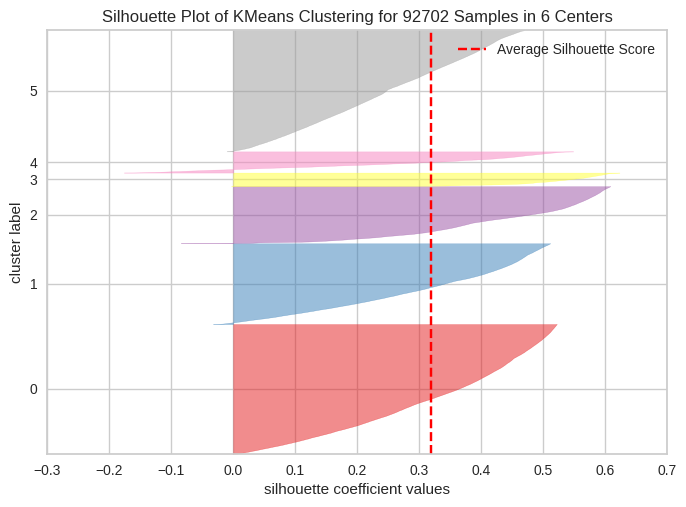

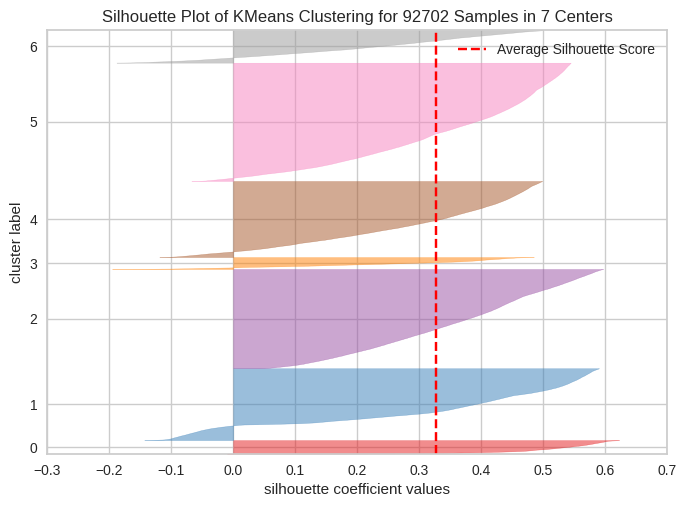

In [100]:
for n_clusters in range(3, 8):
     
    kmeans = KMeans(n_clusters=n_clusters, init='k-means++', random_state=21) 
    visualizer = SilhouetteVisualizer(kmeans)
    visualizer.fit(df_4_scaled)
    visualizer.show()

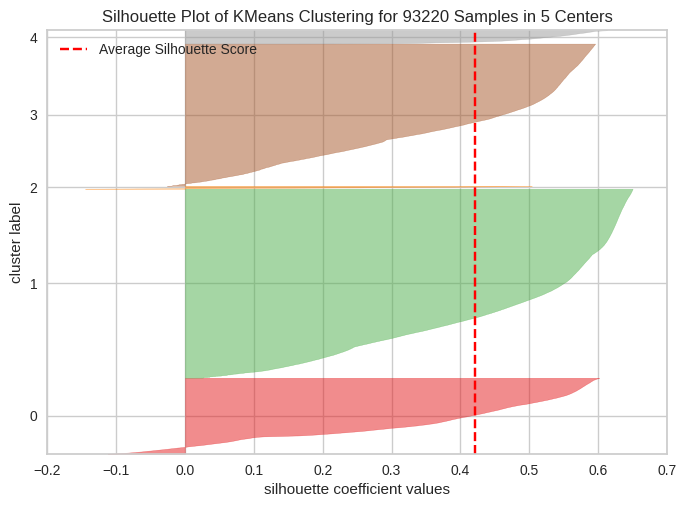

In [15]:
from yellowbrick.cluster import SilhouetteVisualizer

kmeans = KMeans(n_clusters=5, init='k-means++', random_state=21) 
visualizer = SilhouetteVisualizer(kmeans)
visualizer.fit(df_4_scaled)
visualizer.show()

In [118]:
kmeans = KMeans(n_clusters=5, init='k-means++', random_state=21).fit(df_4_scaled)
pred = kmeans.predict(df_4_scaled)
df_4['cluster'] = pred

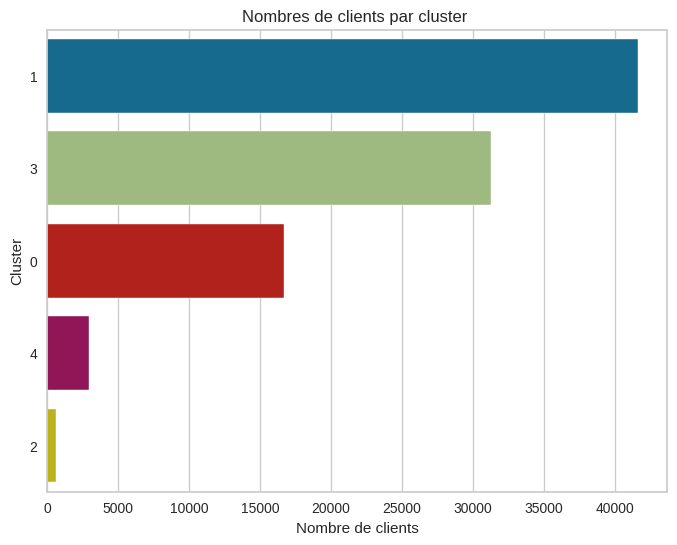

In [119]:
plt.subplots(figsize = (8,6))
cluster = df_4["cluster"]
ax = sns.countplot(y=cluster, order=cluster.value_counts().index)
plt.title("Nombres de clients par cluster ")
plt.xlabel("Nombre de clients")
plt.ylabel("Cluster")
plt.show()

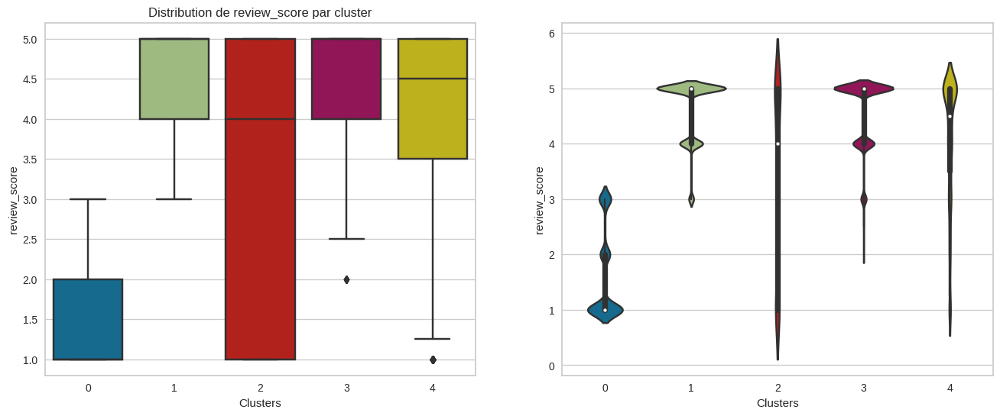

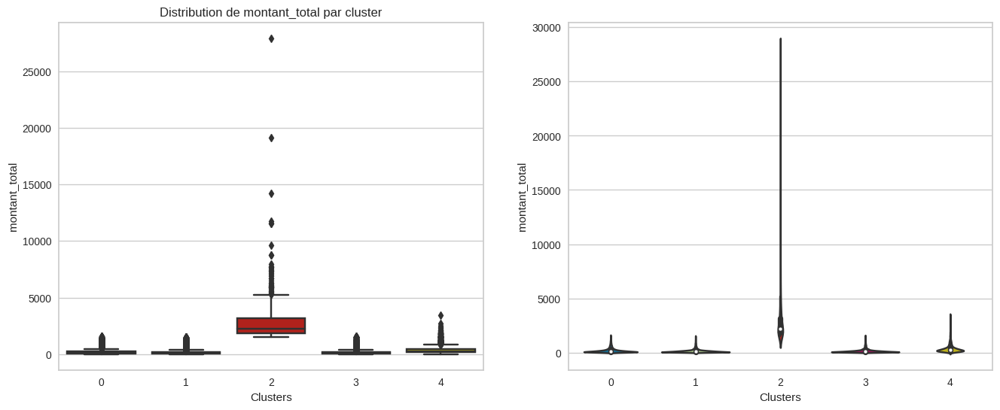

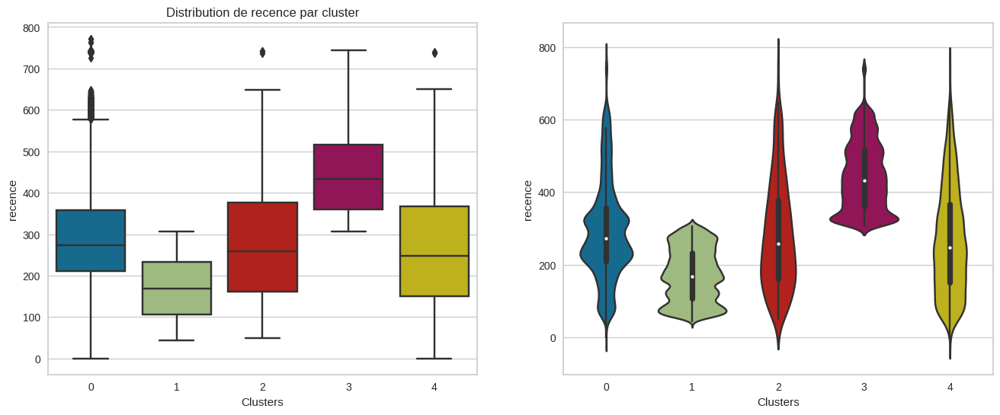

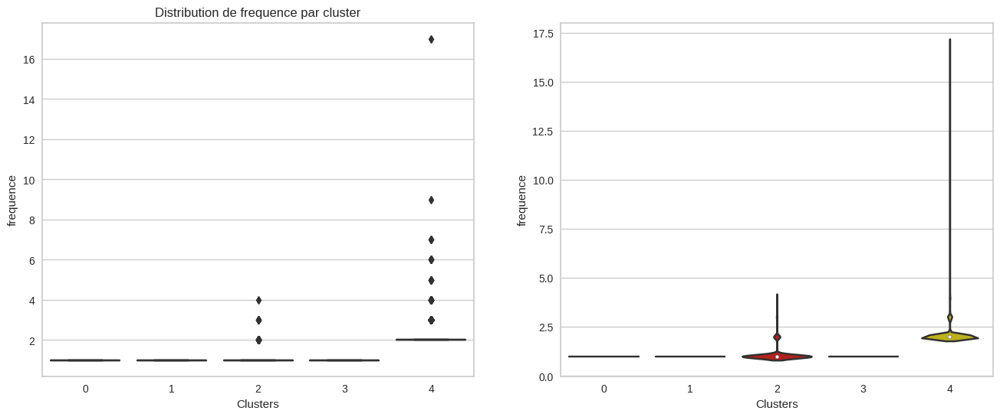

In [120]:
for col in cols_cluster:
    fig, ax = plt.subplots(1, 2, figsize=(16,6))
    sns.boxplot(data=df_4, x='cluster', y=col, ax=ax[0]) 
    titre_1 = "Distribution de " + col + " par cluster"
    ax[0].set_title(titre_1)
    ax[0].set_xlabel("Clusters")
    ax[0].set_ylabel(col)
    
    sns.violinplot(data = df_4, x='cluster', y = col, ax = ax[1] )
    
    ax[1].set_xlabel("Clusters")

    
    plt.show()

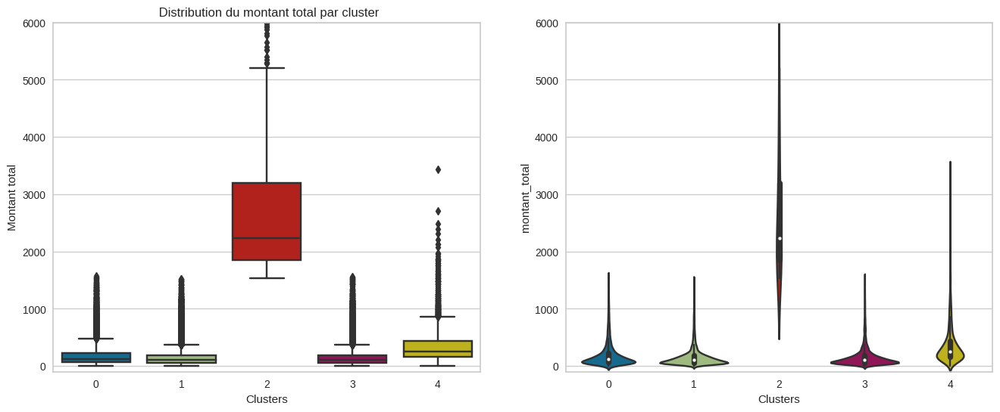

In [123]:
# Zoom sur le montant toal
fig, ax = plt.subplots(1, 2, figsize=(16,6))
sns.boxplot(data=df_4, x='cluster', y='montant_total', ax=ax[0]) 
ax[0].set_title(f' Distribution du montant total par cluster')
ax[0].set_xlabel("Clusters")
ax[0].set_ylabel("Montant total")
ax[0].set_ylim(-100, 6e3)

sns.violinplot(data = df_4, x='cluster', y = 'montant_total', ax = ax[1] )
ax[1].set_xlabel("Clusters")
ax[1].set_ylim(-100, 6e3)

plt.show()

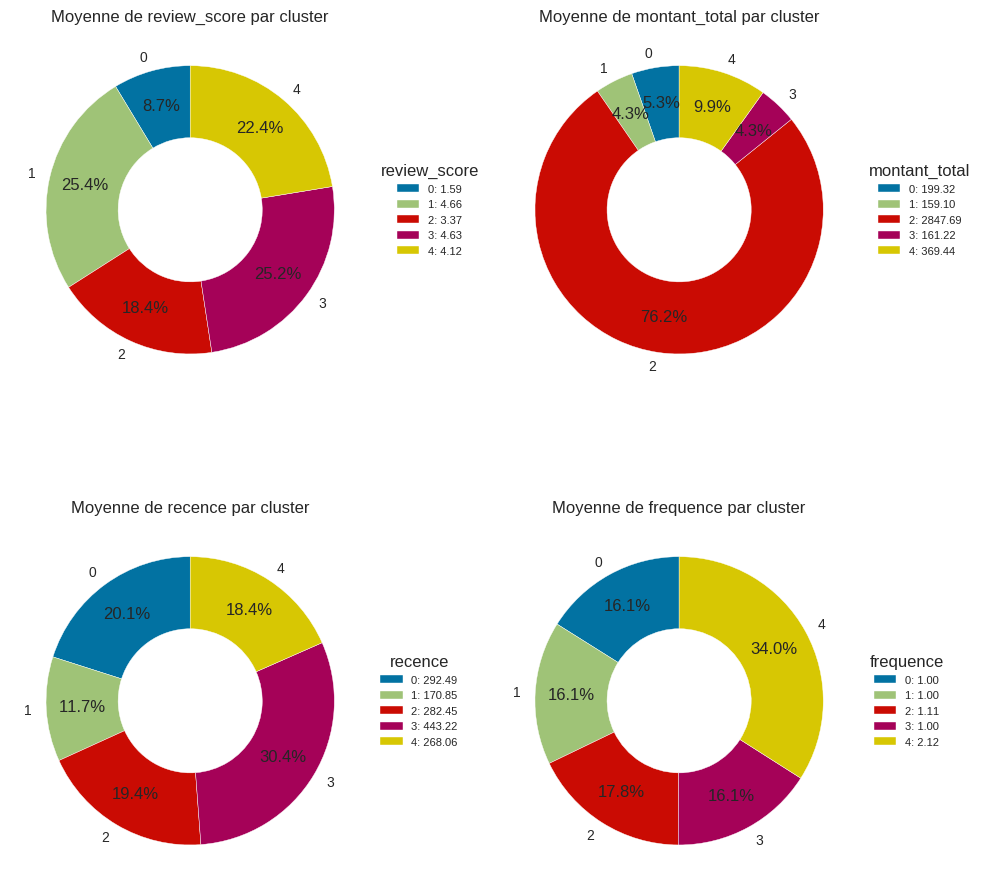

In [124]:
means_by_cluster = df_4.groupby('cluster').mean()

# Création d'un diagramme circulaire avec légende pour chaque variable
fig, axes = plt.subplots(2, 2, figsize=(10, 10))

for i, column in enumerate(df_4.columns[:-1]):  # Exclure la colonne 'cluster'
    ax = axes[i // 2, i % 2]
    wedges, texts, autotexts = ax.pie(means_by_cluster[column], labels=means_by_cluster.index,
                                      autopct='%1.1f%%', startangle=90, wedgeprops=dict(width=0.5),
                                     pctdistance = 0.75)
    ax.set_title(f'Moyenne de {column} par cluster')

    # Création d'une légende à côté du diagramme circulaire
    legend_labels = [f'{cluster}: {mean:.2f}' for cluster, mean in zip(means_by_cluster.index, means_by_cluster[column])]
    ax.legend(wedges, legend_labels, title=f'{column}', bbox_to_anchor=(1, 0.5), loc="center left", fontsize=8)

plt.tight_layout()
plt.show()


In [187]:
sns.set_theme(style="darkgrid", palette="colorblind")

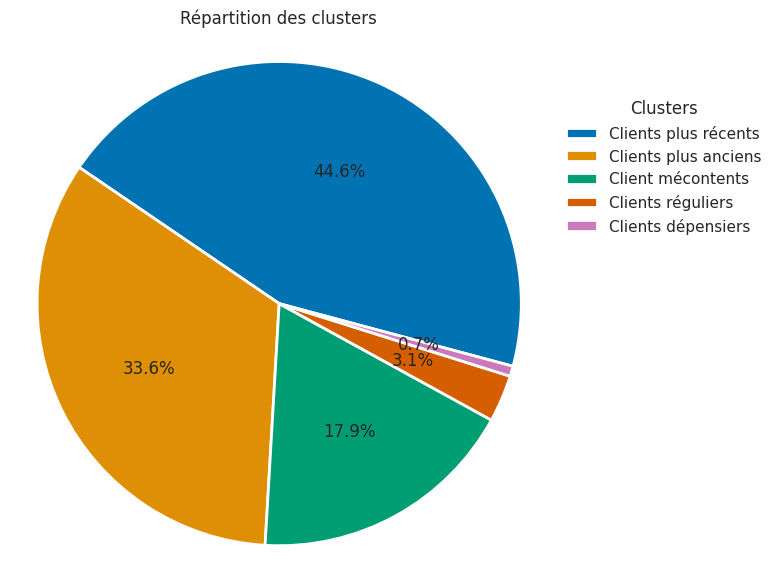

In [188]:
plt.figure(figsize=(7, 7))
cluster_labels = ['Clients plus récents', 
                  'Clients plus anciens',
                  'Client mécontents',
                  'Clients réguliers',
                  'Clients dépensiers'
                 ]
wedges, texts, autotexts = plt.pie(df_4['cluster'].value_counts(),
                                   autopct='%1.1f%%', 
                                   startangle=345, 
                                   wedgeprops={'linewidth': 2, 'edgecolor': 'white'})
plt.axis('equal') 
plt.title('Répartition des clusters ')

# Calcul des dépenses totales par cluster
sum_spend = df_4.groupby('cluster')['montant_total'].sum()

# Ajout d'une légende avec les dépenses totales
legend_labels = [f'{label}' for label in cluster_labels]
plt.legend(wedges, legend_labels, title='Clusters', loc='center left', bbox_to_anchor=(1, 0.75))

plt.show()

In [156]:
means_by_cluster = df_4.groupby('cluster').mean()
sum_by_cluster = df_4.groupby('cluster').sum()

In [128]:
sum_by_cluster

,review_score,montant_total,recence,frequence
cluster,,,,
0,26605.500000,3332592.71,4890498,16720
1,194053.500000,6621750.10,7110789,41621
2,2149.659524,1813979.62,179920,704
3,144909.500000,5048525.10,13878985,31314
4,12058.156600,1081705.77,784894,6196


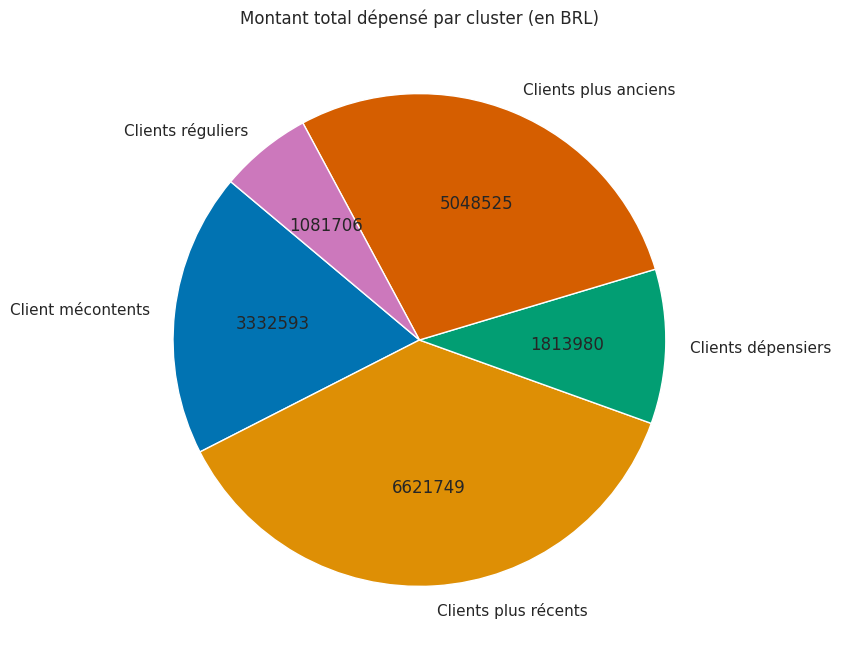

In [189]:
plt.figure(figsize=(8, 8))
plt.pie(sum_by_cluster['montant_total'], 
        labels=sum_by_cluster['montant_total'].index, 
#         labels=cluster_labels,
#         autopct='%1.1f%%',
        autopct=lambda p: f'{p * sum(sum_by_cluster["montant_total"])/100:.0f}',
        startangle=140)
plt.title('Montant total dépensé par cluster (en BRL)')
plt.show()


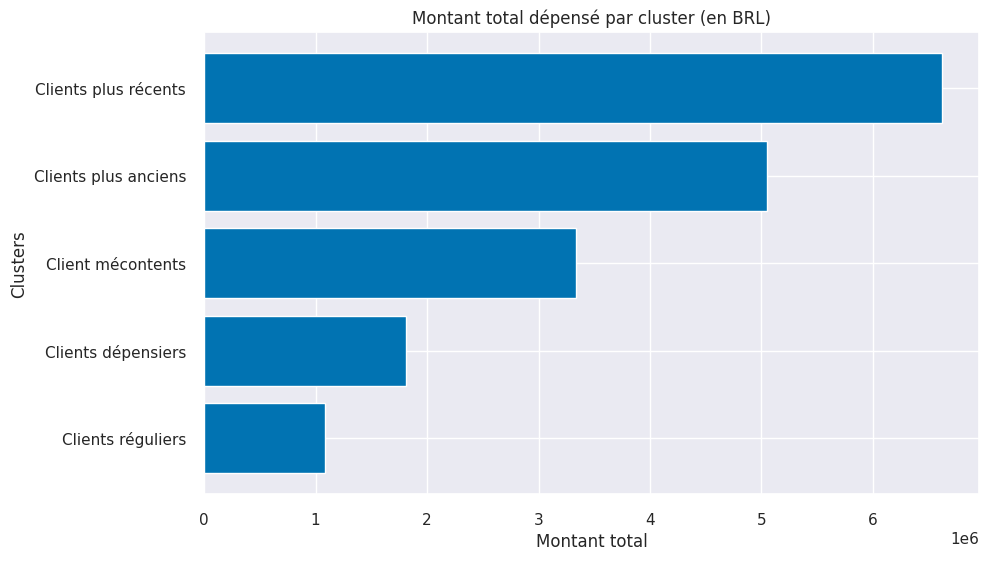

In [190]:
sum_by_cluster = sum_by_cluster.rename(index = 
                                       {0: 'Client mécontents', 
                                        1: 'Clients plus récents', 
                                        2: 'Clients dépensiers', 
                                        3: 'Clients plus anciens', 
                                        4: 'Clients réguliers'
                                        })

plt.figure(figsize=(10, 6))
plt.barh(sum_by_cluster['montant_total'].sort_values().index, 
         sum_by_cluster['montant_total'].sort_values())
plt.ylabel('Clusters')
plt.xlabel('Montant total')
plt.title('Montant total dépensé par cluster (en BRL)')
plt.show()                               

In [165]:
df_4.cluster.value_counts()

1    41621
3    31314
0    16720
4     2928
2      637
Name: cluster, dtype: int64

### Interprétation: 
   - cluster 0 : Clients plus anciens
   - Cluster 1 : Clients plus récents
   - Cluster 2 : Clients insatisfaits 
   - Cluster 3 : Clients dépensiers
   - Cluster 4 : Clients plus fréquents

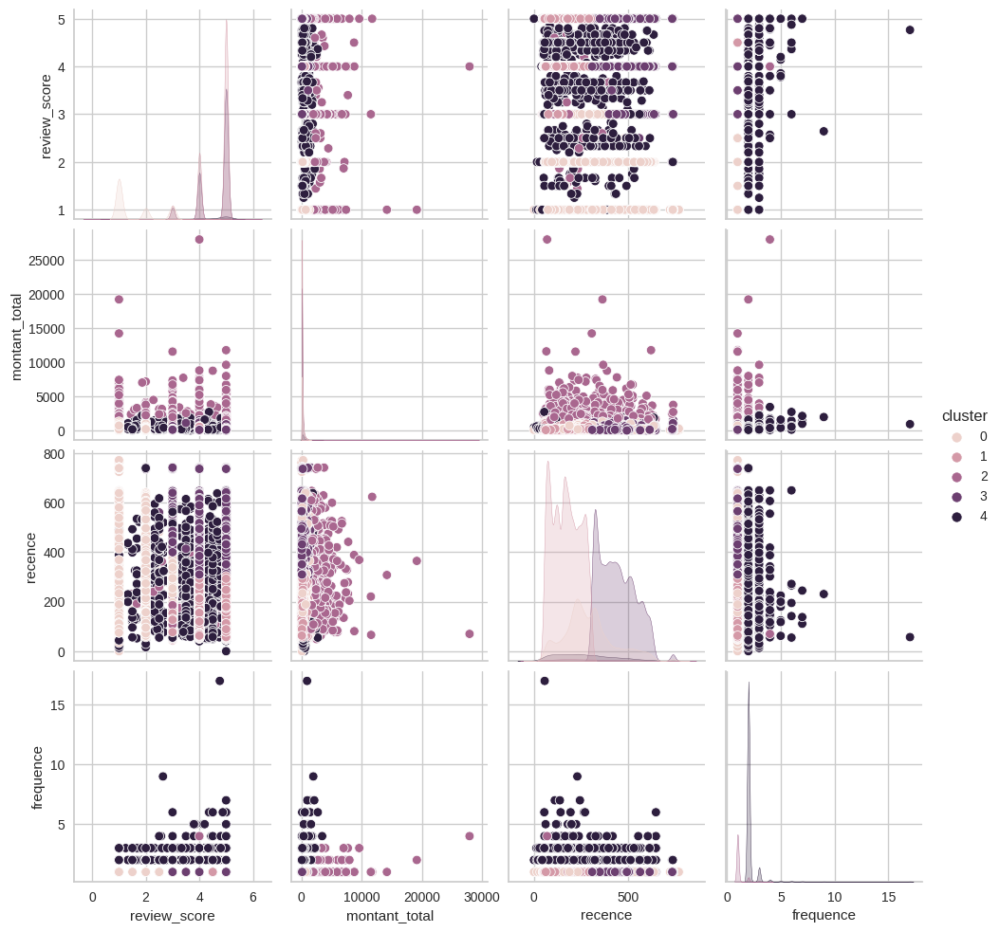

In [119]:
sns.pairplot(df_4, hue='cluster')

In [111]:
pred = df_4['cluster']

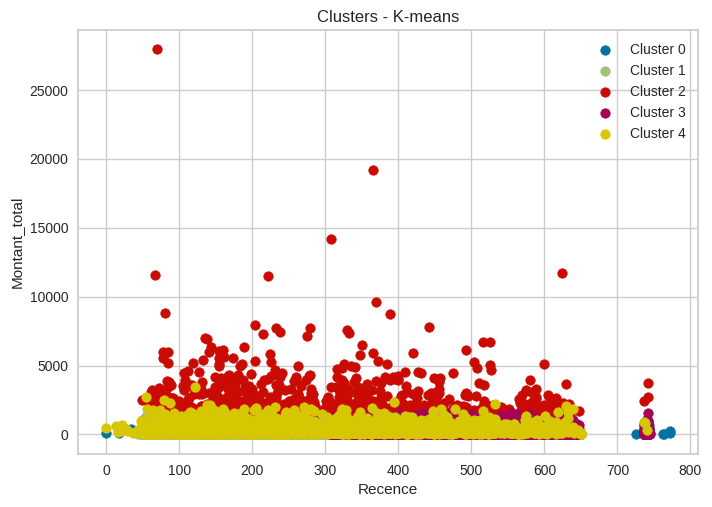

In [112]:

for cluster_num in set(pred):
    plt.scatter(df_4.loc[pred == cluster_num, 'recence'], df_4.loc[pred == cluster_num, 'montant_total'], 
                label=f'Cluster {cluster_num}')

plt.title('Clusters - K-means')
plt.xlabel('Recence')
plt.ylabel('Montant_total')
plt.legend()
plt.show()

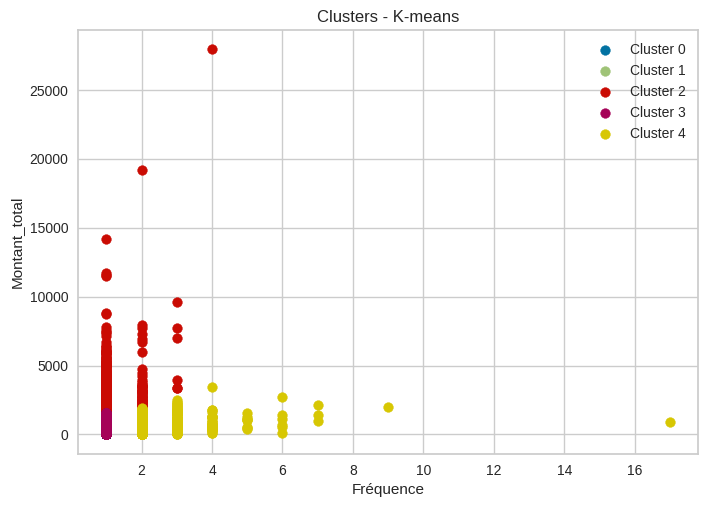

In [116]:

for cluster_num in set(pred):
    plt.scatter(df_4.loc[pred == cluster_num, 'frequence'], df_4.loc[pred == cluster_num, 'montant_total'], 
                label=f'Cluster {cluster_num}')

plt.title('Clusters - K-means')
plt.xlabel('Fréquence')
plt.ylabel('Montant_total')
plt.legend()
plt.show()

In [50]:
means_by_cluster

,review_score,montant_total,recence,frequence
cluster,,,,
0,1.591238,199.317746,292.493900,1.000000
1,4.662394,159.096372,170.846183,1.000000
2,3.374662,2847.691711,282.448980,1.105181
3,4.627627,161.222619,443.219806,1.000000
4,4.118223,369.435031,268.064891,2.116120


# 2. DBScan :

In [7]:
import warnings
warnings.filterwarnings("ignore")

In [8]:
from sklearn.preprocessing import StandardScaler

features = ['review_score', 'montant_total', 'recence', 'frequence']
df_dbs = data[features]

df_dbs.drop_duplicates(inplace=True)
df_dbs.dropna(inplace=True)
df_dbs = df_dbs.reset_index(drop=True)

# Standardisation des données
scaler = StandardScaler()
df_dbs_scaled = scaler.fit_transform(df_dbs)
df_dbs_scaled = pd.DataFrame(df_dbs_scaled, columns=df_dbs.columns)

DBSCAN requiert deux paramètres principaux :

   - eps, qui définit la taille du voisinage d'un point (rayon de la boule),

   - min_samples, qui définit la densité minimale à dépasser (le nombre de voisins dans la boule pour être considéré comme point central).

Nous allons tester plusieurs valeurs d'epsilon et min_samples et comparer les scores de silhouette :

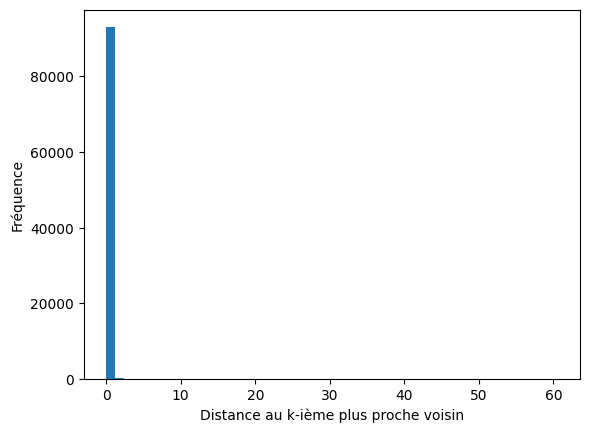

In [9]:
from sklearn.neighbors import NearestNeighbors


k = 10  # k choisi 
nb = NearestNeighbors(n_neighbors=k).fit(df_dbs_scaled)
distance, indice = nb.kneighbors(df_dbs_scaled)

# Visualisation de l'histogramme des distances
plt.hist(distance[:, -1], bins=50)
plt.xlabel('Distance au k-ième plus proche voisin')
plt.ylabel('Fréquence')
plt.show()


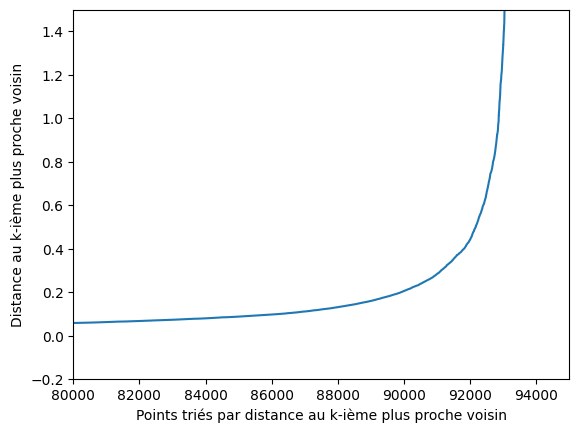

In [18]:
# les distances calculées précédemment
k_distance = distance[:, -1]
k_distance.sort()

# Tracé du graphique de la k-distance
plt.plot(list(range(1, len(df_dbs_scaled) + 1)), k_distance)
plt.xlabel('Points triés par distance au k-ième plus proche voisin')
plt.ylabel('Distance au k-ième plus proche voisin')
plt.xlim(8e4, 9.5e4)
plt.ylim(-0.2, 1.5)
plt.show()


Fixons eps= 0.5, min_samples = 2*4= 8 (4 est le nombre de variables)

In [19]:
from sklearn.cluster import DBSCAN

dbs_pred = DBSCAN(eps = 0.5, min_samples=8).fit_predict(df_dbs_scaled)
df_dbs['cluster'] = dbs_pred
df_dbs.cluster.value_counts()

 0     89557
 1      2546
-1       682
 5       139
 4        93
 3        81
 2        43
 7        19
 8        18
 9        17
 10       13
 6         6
 11        6
Name: cluster, dtype: int64

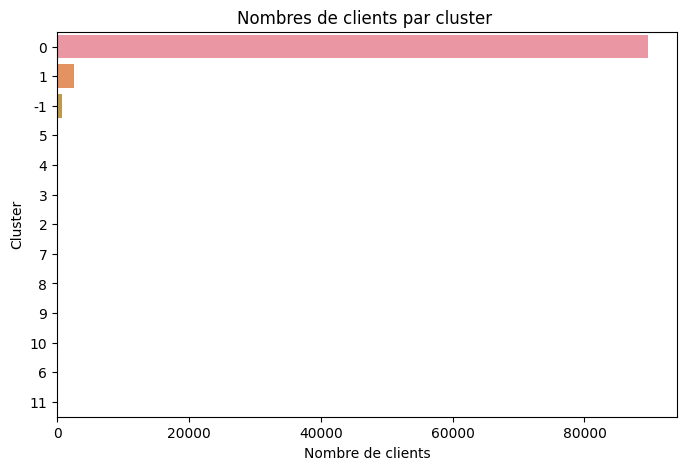

In [20]:
plt.subplots(figsize = (8,5))
cluster = df_dbs["cluster"]
ax = sns.countplot(y=cluster, order=cluster.value_counts().index)
plt.title("Nombres de clients par cluster ")
plt.xlabel("Nombre de clients")
plt.ylabel("Cluster")
plt.show()

In [21]:
from sklearn import metrics

db = DBSCAN(eps = 0.5, min_samples=8).fit(df_dbs_scaled)
labels = db.labels_

print(f"Silhouette Coefficient: {metrics.silhouette_score(df_dbs_scaled, labels):.3f}")

Silhouette Coefficient: 0.282


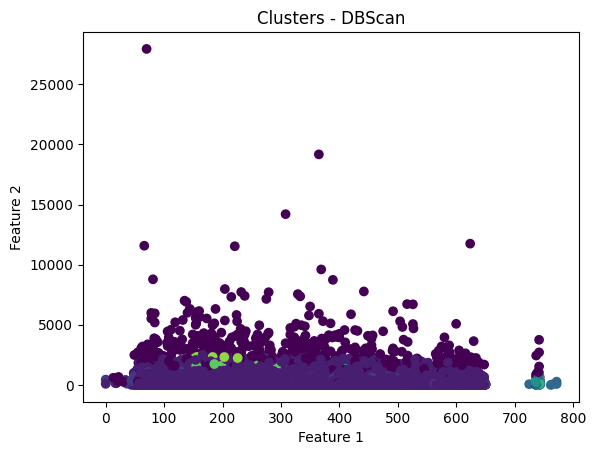

In [22]:
plt.scatter(df_dbs['recence'], df_dbs['montant_total'], c=dbs_pred, cmap='viridis')
plt.title('Clusters - DBScan')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.show()

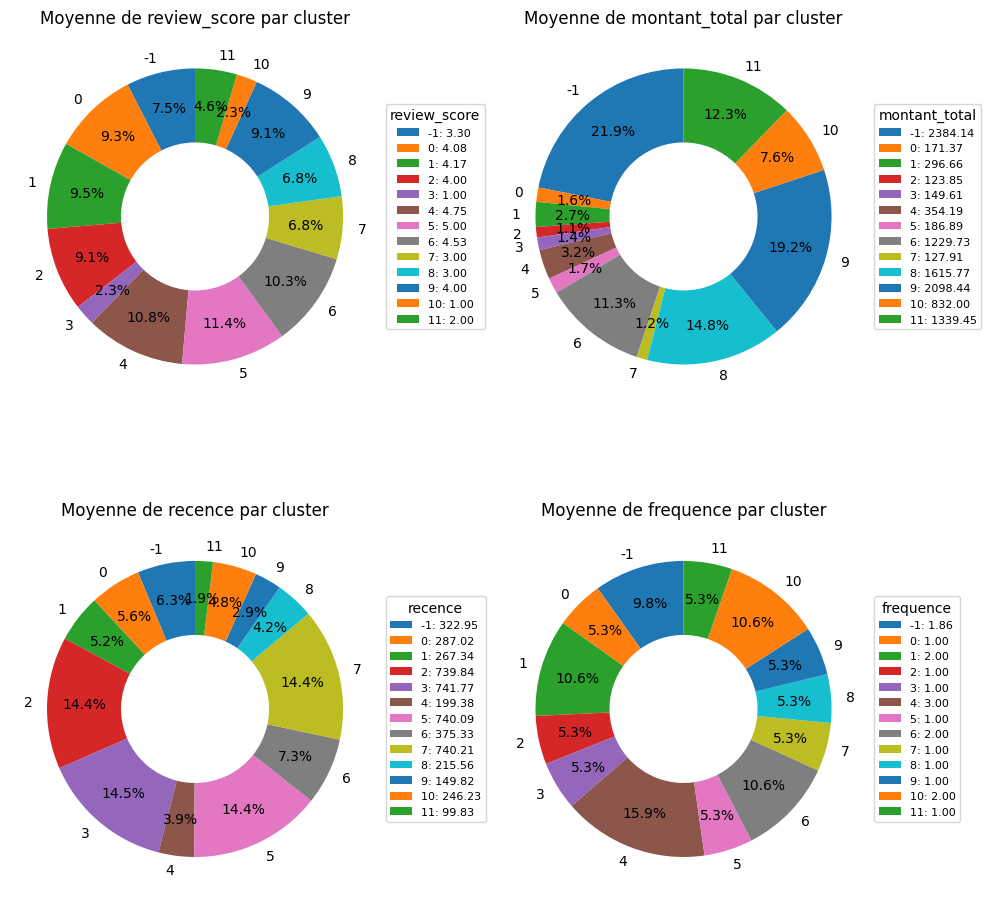

In [40]:
means_by_cluster = df_dbs.groupby('cluster').mean()

# Création d'un diagramme circulaire avec légende pour chaque variable
fig, axes = plt.subplots(2, 2, figsize=(10, 10))

for i, column in enumerate(df_dbs.columns[:-1]):  # Exclure la colonne 'cluster'
    ax = axes[i // 2, i % 2]
    wedges, texts, autotexts = ax.pie(means_by_cluster[column], labels=means_by_cluster.index,
                                      autopct='%1.1f%%', startangle=90, wedgeprops=dict(width=0.5),
                                     pctdistance = 0.75)
    ax.set_title(f'Moyenne de {column} par cluster')

    # Création d'une légende à côté du diagramme circulaire
    legend_labels = [f'{cluster}: {mean:.2f}' for cluster, mean in zip(means_by_cluster.index, means_by_cluster[column])]
    ax.legend(wedges, legend_labels, title=f'{column}', bbox_to_anchor=(1, 0.5), loc="center left", fontsize=8)

plt.tight_layout()
plt.show()


### Test n°2 - DBScan

In [24]:
features_2 = ['review_score', 'mean_order_price', 'recence', 'frequence']
df_dbs_2 = data[features_2]

df_dbs_2.drop_duplicates(inplace=True)
df_dbs_2.dropna(inplace=True)
df_dbs_2 = df_dbs_2.reset_index(drop=True)

# Standardisation des données
scaler = StandardScaler()
df_dbs_sca_2 = scaler.fit_transform(df_dbs_2)
df_dbs_sca_2 = pd.DataFrame(df_dbs_sca_2, columns=df_dbs_2.columns)

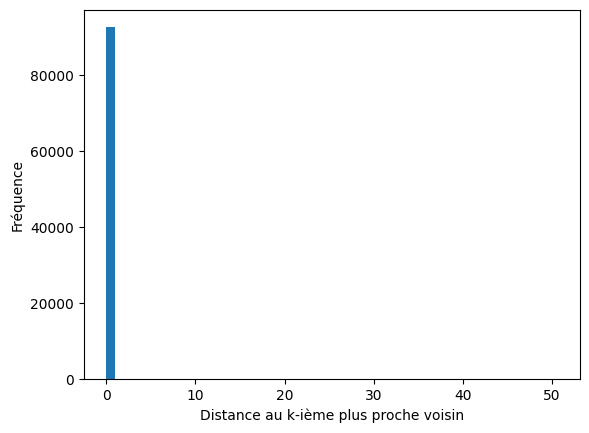

In [25]:
from sklearn.neighbors import NearestNeighbors


k = 10  # k choisi 
nb = NearestNeighbors(n_neighbors=k).fit(df_dbs_sca_2)
distance, indice = nb.kneighbors(df_dbs_sca_2)

# Visualisation de l'histogramme des distances
plt.hist(distance[:, -1], bins=50)
plt.xlabel('Distance au k-ième plus proche voisin')
plt.ylabel('Fréquence')
plt.show()


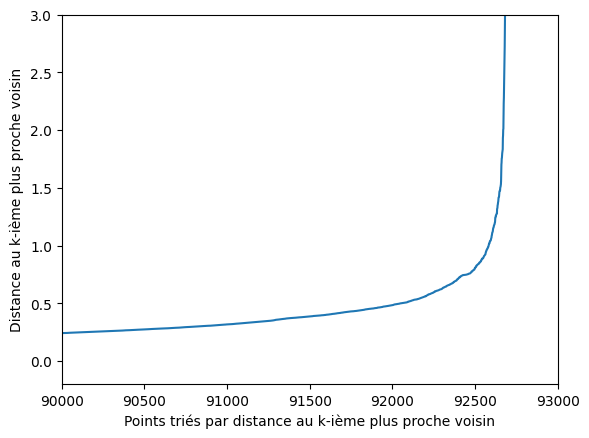

In [26]:
# les distances calculées précédemment
k_distance = distance[:, -1]
k_distance.sort()

# Tracé du graphique de la k-distance
plt.plot(list(range(1, len(df_dbs_sca_2) + 1)), k_distance)
plt.xlabel('Points triés par distance au k-ième plus proche voisin')
plt.ylabel('Distance au k-ième plus proche voisin')
plt.xlim(9e4, 9.3e4)
plt.ylim(-0.2, 3)
plt.show()


In [32]:
dbs_pred_2 = DBSCAN(eps = 0.2, min_samples=45).fit_predict(df_dbs_sca_2)
df_dbs_2['cluster'] = dbs_pred_2
df_dbs_2.cluster.value_counts()

 0    49320
 1    16454
 3     9088
-1     7938
 2     6711
 4     2206
 5      708
 7      165
 6       75
 8       37
Name: cluster, dtype: int64

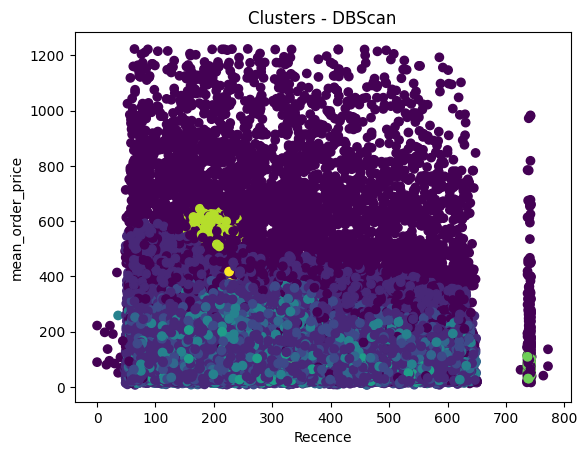

In [33]:
plt.scatter(df_dbs_2['recence'], df_dbs_2['mean_order_price'], c=dbs_pred_2, cmap='viridis')
plt.title('Clusters - DBScan')
plt.xlabel('Recence')
plt.ylabel('mean_order_price')
plt.show()

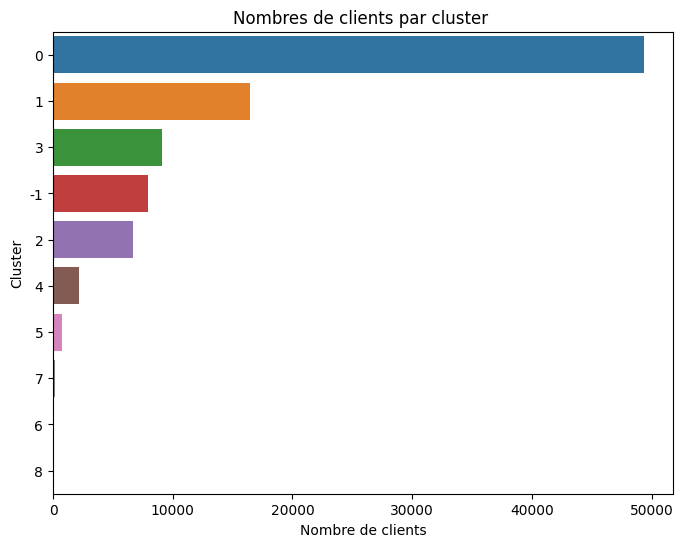

In [34]:
plt.subplots(figsize = (8,6))
cluster = df_dbs_2["cluster"]
ax = sns.countplot(y=cluster, order=cluster.value_counts().index)
plt.title("Nombres de clients par cluster ")
plt.xlabel("Nombre de clients")
plt.ylabel("Cluster")
plt.show()

In [36]:
db = DBSCAN(eps = 0.2, min_samples=45).fit(df_dbs_sca_2)
labels = db.labels_

print(f"Silhouette Coefficient: {metrics.silhouette_score(df_dbs_sca_2, labels):.3f}")

Silhouette Coefficient: 0.037


In [194]:
df_dbs_2

,review_score,mean_order_price,recence,frequence,cluster
0,5.0,141.90,160,1,0
1,4.0,27.19,163,1,1
2,3.0,86.22,585,1,2
3,4.0,43.62,369,1,1
4,5.0,196.89,336,1,0
...,...,...,...,...,...
92697,5.0,73.16,303,1,0
92698,5.0,167.32,293,1,0
92699,1.0,710.70,189,1,-1
92700,4.0,84.58,310,1,1


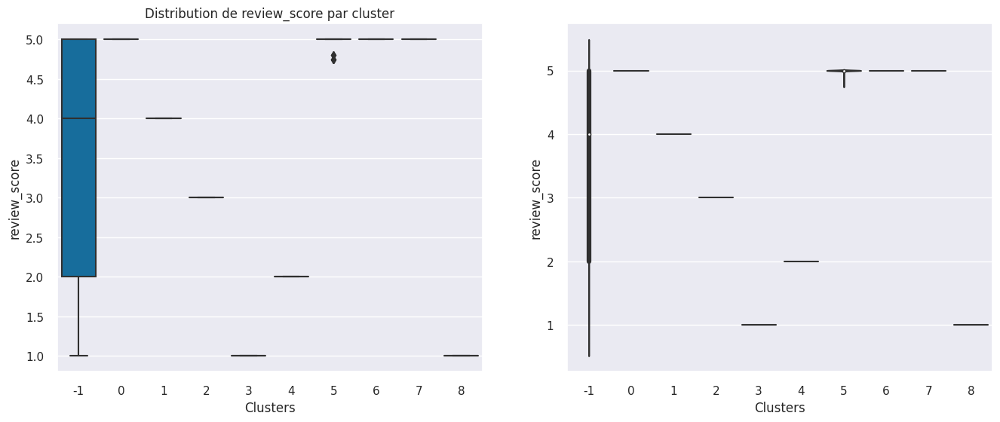

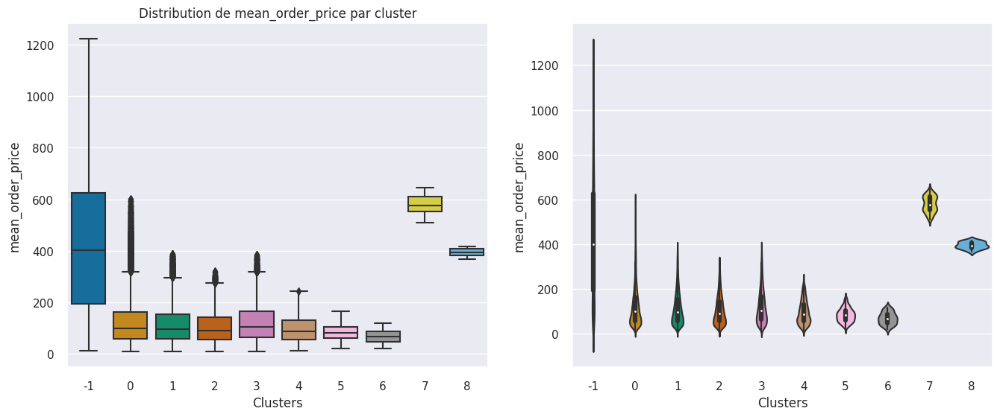

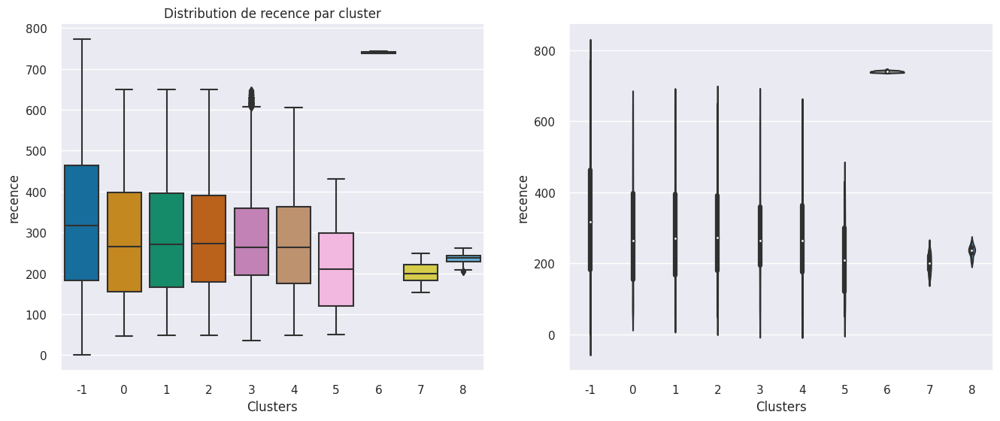

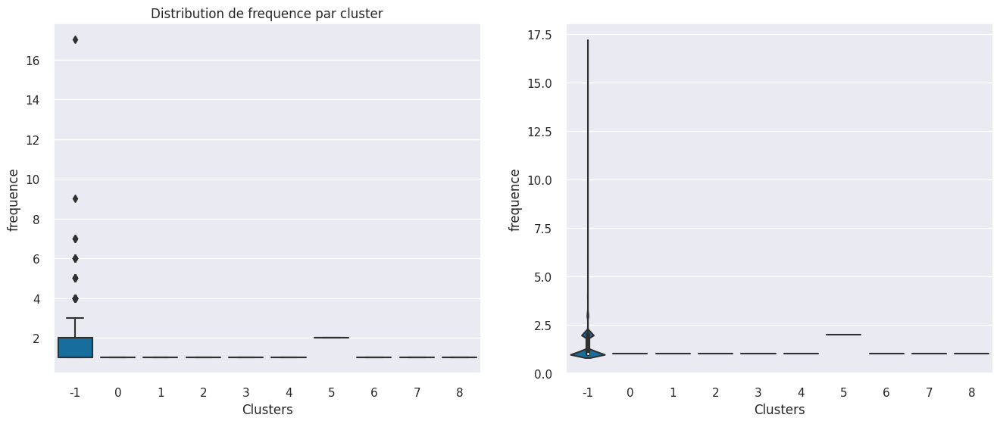

In [195]:
for col in df_dbs_2.columns[:-1]:
    fig, ax = plt.subplots(1, 2, figsize=(16,6))
    sns.boxplot(data=df_dbs_2, x='cluster', y=col, ax=ax[0]) 
    titre_1 = "Distribution de " + col + " par cluster"
    ax[0].set_title(titre_1)
    ax[0].set_xlabel("Clusters")
    ax[0].set_ylabel(col)
    
    sns.violinplot(data = df_dbs_2, x='cluster', y = col, ax = ax[1] )
    
    ax[1].set_xlabel("Clusters")

    
    plt.show()

## Test n°3 - DBScan

In [6]:
import warnings
warnings.filterwarnings("ignore")

In [58]:
def count_cluster(data):
    plt.subplots(figsize = (8,6))
    cluster = data["cluster"]
    ax = sns.countplot(y=cluster, order=cluster.value_counts().index)
    plt.title("Nombres de clients par cluster ")
    plt.xlabel("Nombre de clients")
    plt.ylabel("Cluster")
    plt.show()

    
def boxplot_cluster(data):
    
    for col in data.columns:
        fig, ax = plt.subplots(1, 2, figsize=(16,6))
        sns.boxplot(data=data, x='cluster', y=col, ax=ax[0]) 
        titre_1 = "Distribution de " + col + " par cluster"
        ax[0].set_title(titre_1)
        ax[0].set_xlabel("Clusters")
        ax[0].set_ylabel(col)

        sns.violinplot(data = data, x='cluster', y = col, ax = ax[1] )
        ax[1].set_xlabel("Clusters")
        plt.show()
    
    
def pairplot_cluster(data):
    sns.pairplot(data, hue='cluster')

In [ ]:
import random

def sampling_data(data, sample_size):
    
    # liste des indexes des observations sélectionnées
    sample_index = []

    # On effectue l'échantillonnage jusqu'à atteindre la taille souhaitée
    while len(sample_index) < sample_size:

        # On sélectionne aléatoirement un index
        random_index = random.randint(0, len(data) - 1)

        # On vérifie si l'index n'a pas déjà été sélectionné pour éviter la duplication
        if random_index not in sample_index:
            sample_index.append(random_index)


    sampled_data = data.iloc[sample_index]
    return sampled_data


In [37]:
from sklearn.preprocessing import StandardScaler

# Choix des features
features = ['delevery_time', 'nb_item', 'product_weight_g', 'review_score', 
              'payment_installments', 'mean_order_price', 'recence', 'frequence']
df_dbs = data[features]

df_dbs.drop_duplicates(inplace=True)
df_dbs.dropna(inplace=True)
df_dbs = df_dbs.reset_index(drop=True)

# taille de l'échantillon du dataset
sample_size = 10000
sampled_df = sampling_data(df_dbs, sample_size)
print('La taille du dataset initial :', df_dbs.shape)
print("La taille de l'echantillon :", sampled_df.shape)

# Standardisation des données
scaler = StandardScaler()
df_dbs_scaled = scaler.fit_transform(df_dbs)
df_dbs_scaled = pd.DataFrame(df_dbs_scaled, columns=df_dbs.columns)

La taille du dataset initial : (90428, 8)
La taille de l'echantillon : (10000, 8)


In [39]:
sampled_df.head(5)

,delevery_time,nb_item,product_weight_g,review_score,payment_installments,mean_order_price,recence,frequence
36829,-0.641456,-0.27078,-0.429671,0.662247,-0.708773,-0.577534,-0.826224,-0.166035
36058,0.420431,-0.27078,0.480711,-0.902957,0.430762,1.117534,-0.235783,-0.166035
19965,-0.322890,-0.27078,-0.092492,0.662247,-0.708773,0.027673,1.443693,-0.166035
48454,-0.216701,-0.27078,-0.277940,-0.120355,-0.328928,-0.497642,-0.216102,-0.166035
44498,0.526620,-0.27078,-0.210505,0.662247,1.570298,0.273937,0.407141,-0.166035


In [49]:
from scipy.stats import ks_2samp

# Comparer les distributions des variables du dataset initial avec celle de l'échantillon
    
# Effectuer le test de Kolmogorov-Smirnov pour chaque colonne :

alpha = 0.05  # Niveau de signification
p_values = []
for col, sample_col in zip(df_dbs_scaled, sampled_df):
    ks_statistic, p_value = ks_2samp(df_dbs_scaled[col], sampled_df[sample_col])
    p_values.append(p_value)
    
    if p_value < alpha:
        
        print("les distributions de ", col, " et ", sample_col, " sont différentes.")

print(f"Valeurs de p = {p_values}")


Valeurs de p = [0.9323790483067087, 0.9953698402174965, 0.5264820479327814, 0.9999999996137469, 0.8666448082656037, 0.9385079278408239, 0.1950227887953212, 0.9999914170565222]


In [79]:
from sklearn.cluster import DBSCAN
from sklearn import metrics

def DBScan_optimal_params(data, epsilons, min_samples):
    sil_avg = []
    best_value = [0,0,0,0]

    for i in range(len(epsilons)):
        for j in range(len(min_samples)):

            db = DBSCAN(min_samples = min_samples[j], eps =epsilons[i]).fit(data)


            core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
            core_samples_mask[db.core_sample_indices_] = True
            labels = db.labels_

            # Number of clusters in labels, ignoring noise if present.
            n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
            n_noise_ = list(labels).count(-1)


            silhouette_avg = metrics.silhouette_score(data, labels)
            if silhouette_avg > best_value[3]:
                best_value=(epsilons[i], min_samples[j], n_clusters_, silhouette_avg)
            sil_avg.append(silhouette_avg)

    print("epsilon=", best_value[0], 
          "\nmin_sample=", best_value[1],
          "\nnumber of clusters=", best_value[2],
          "\naverage silhouette score= %.4f" % best_value[3])
    
    return best_value[0], best_value[1]

In [80]:
dbs_data = sampled_df.copy()
features = ['review_score','mean_order_price', 'recence', 'frequence']
dbs_data = dbs_data[features]

epsilons = [1.25, 1.5, 1.75, 2, 2.25, 2.5, 2.75, 3, 3.25, 3.5, 3.75, 4]
min_samples = [5, 10, 15, 20, 25]

eps, min_sample = DBScan_optimal_params(dbs_data, epsilons, min_samples)

epsilon= 3 
min_sample= 5 
number of clusters= 3 
average silhouette score= 0.5873


In [81]:
dbs_pred = DBSCAN(eps = eps , min_samples= min_sample).fit_predict(dbs_data)
dbs_data['cluster'] = dbs_pred

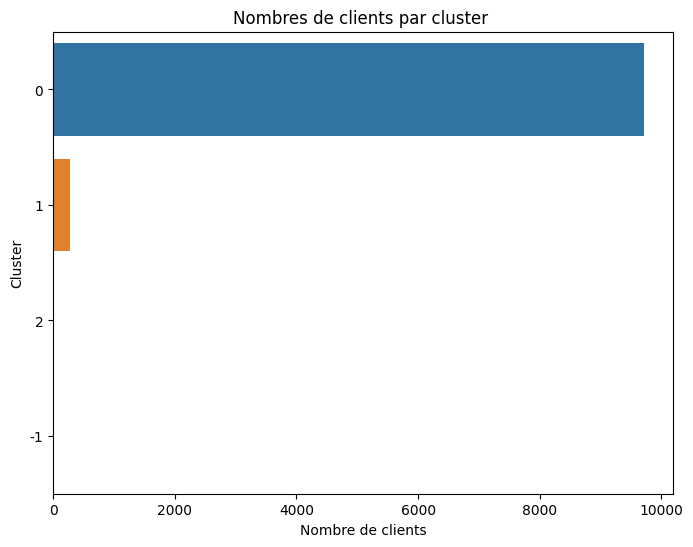

In [82]:
count_cluster(dbs_data)

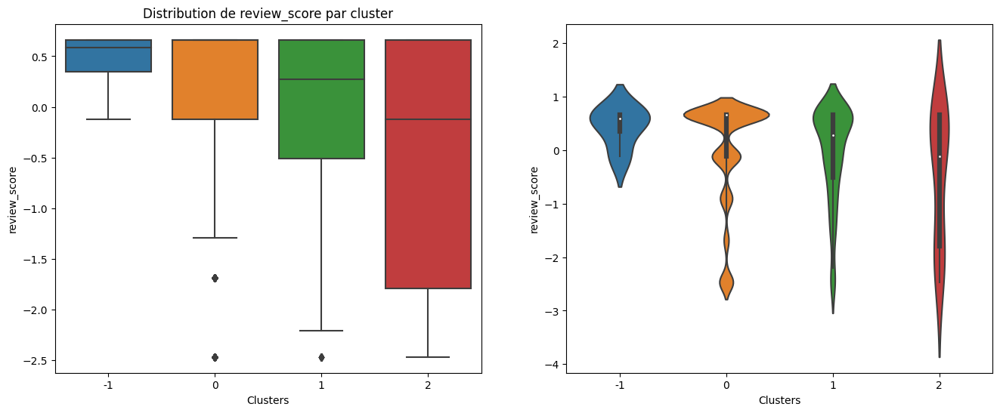

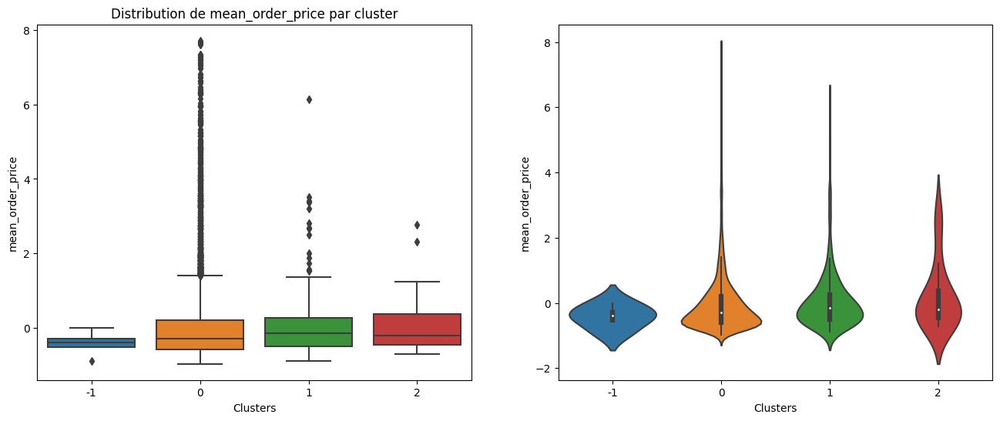

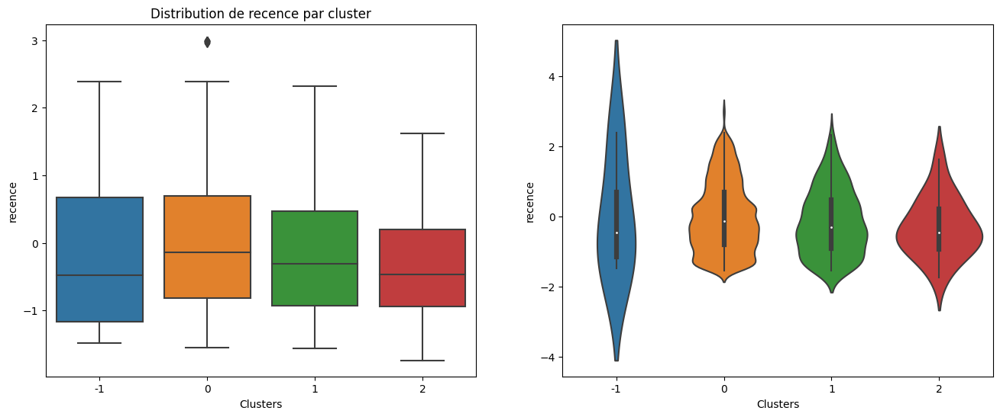

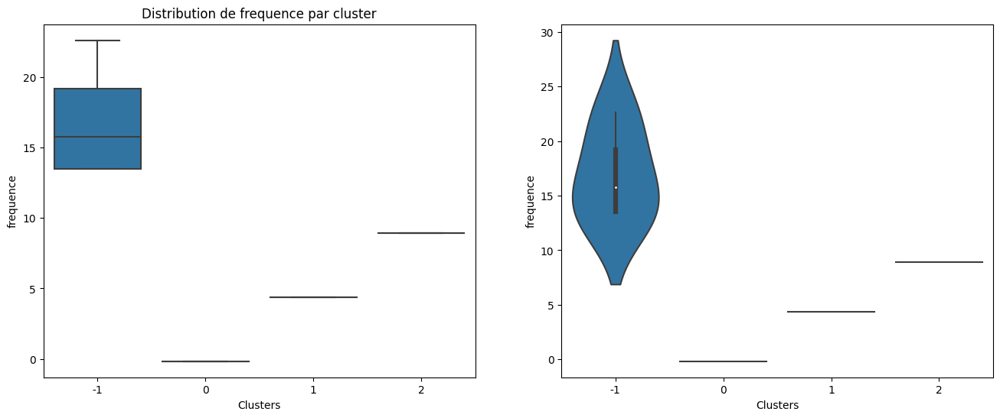

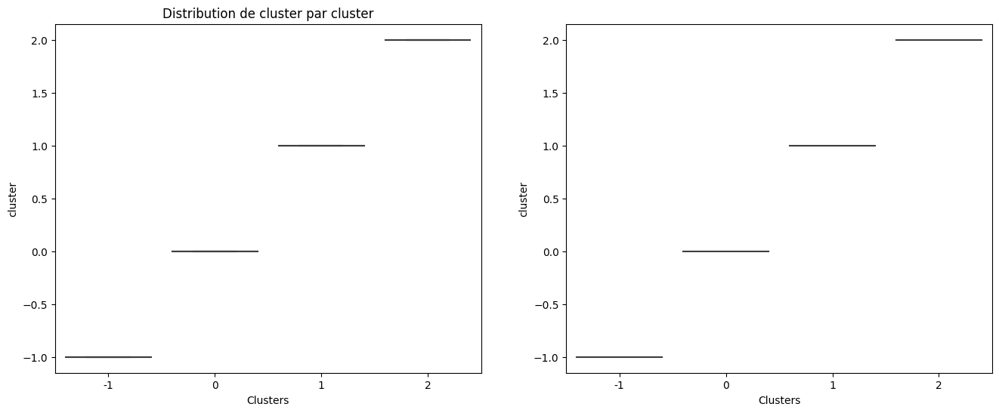

In [83]:
boxplot_cluster(dbs_data)

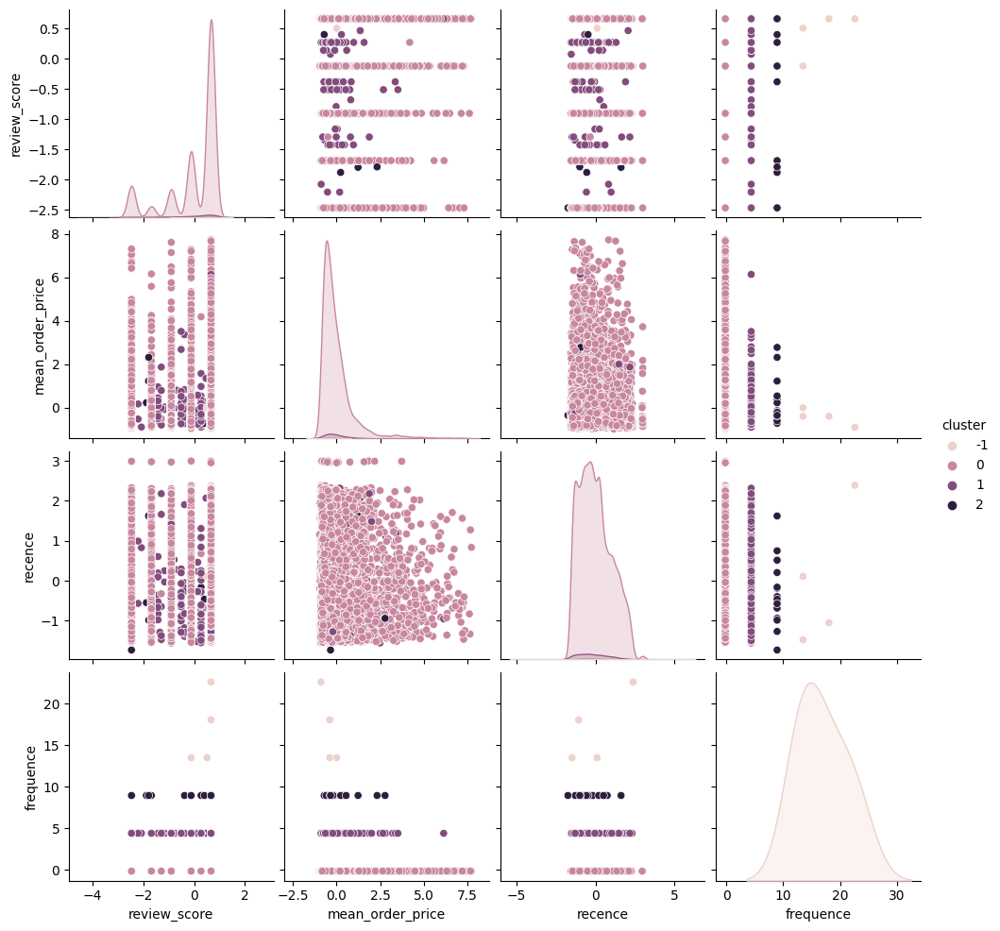

In [84]:
pairplot_cluster(dbs_data)

La répartition des clients par clusters n'est pas équilibrée, le cluster 0 est prédominant. L'interprétation est donc difficile

## 3. Classification ascendante hiérarchique :

### Test n°1 :
Avec les variables suivantes : 

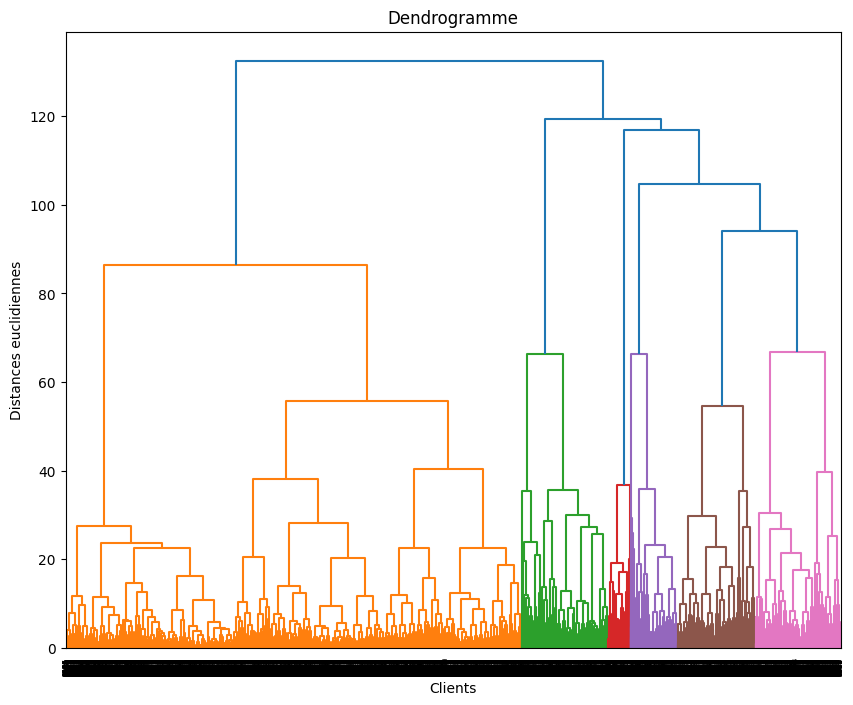

In [52]:
#librairies pour la CAH

from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering

#générer la matrice des liens
Z = linkage(sampled_df,method='ward',metric='euclidean')

#affichage du dendrogramme
plt.figure(figsize=(10,8))
dendrogram(Z)
plt.title("Dendrogramme")
plt.xlabel('Clients')
plt.ylabel('Distances euclidiennes')
plt.show()


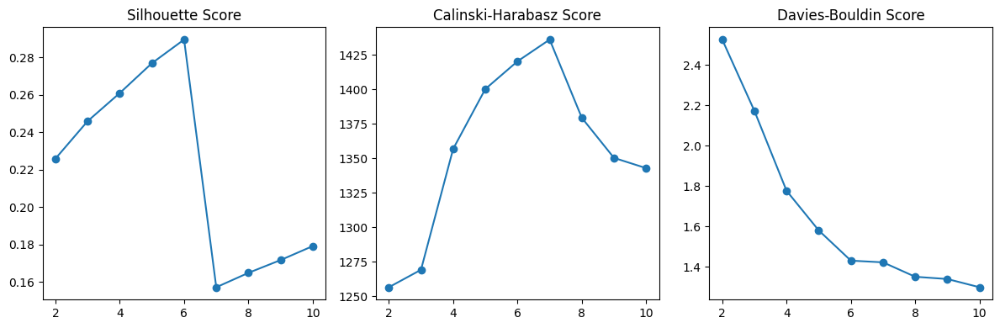

In [85]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
import matplotlib.pyplot as plt

# X est votre ensemble de données
X = sampled_df.copy()
# Liste pour stocker les métriques
silhouette_scores = []
calinski_scores = []
davies_bouldin_scores = []

# Nombre de clusters à tester
for n_clusters in range(2, 11):
    # Appliquer CAH
    CAH = AgglomerativeClustering(n_clusters=n_clusters, metric='euclidean', linkage='ward')
    labels = CAH.fit_predict(X)
    
    # Calculer les métriques
    silhouette_scores.append(silhouette_score(X, labels))
    calinski_scores.append(calinski_harabasz_score(X, labels))
    davies_bouldin_scores.append(davies_bouldin_score(X, labels))

# Tracer les métriques
plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.plot(range(2, 11), silhouette_scores, marker='o')
plt.title('Silhouette Score')

plt.subplot(1, 3, 2)
plt.plot(range(2, 11), calinski_scores, marker='o')
plt.title('Calinski-Harabasz Score')

plt.subplot(1, 3, 3)
plt.plot(range(2, 11), davies_bouldin_scores, marker='o')
plt.title('Davies-Bouldin Score')

plt.tight_layout()
plt.show()


Le nombre de cluster optimal est 6 clusters

In [103]:
# Fit le modèle Agglomerative Clustering 
df = sampled_df.copy()
cah = AgglomerativeClustering(n_clusters=6, metric='euclidean', linkage='ward')
y_cah = cah.fit_predict(df)

# Ajout des labels au dataset 
df['cluster'] = y_cah


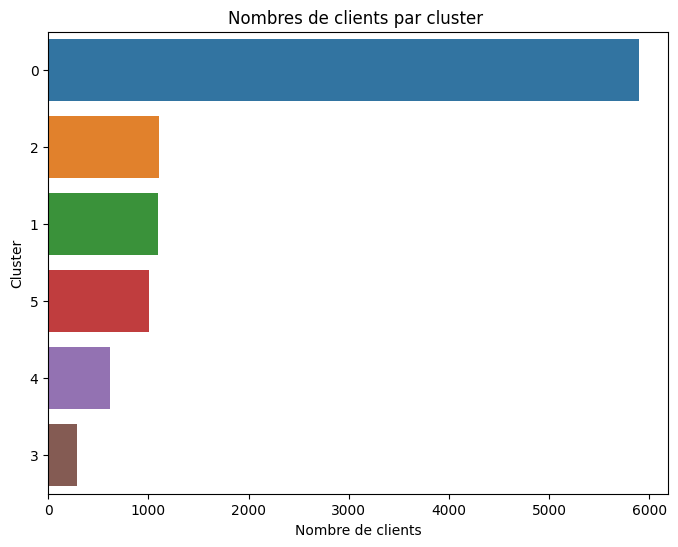

In [104]:
count_cluster(df)

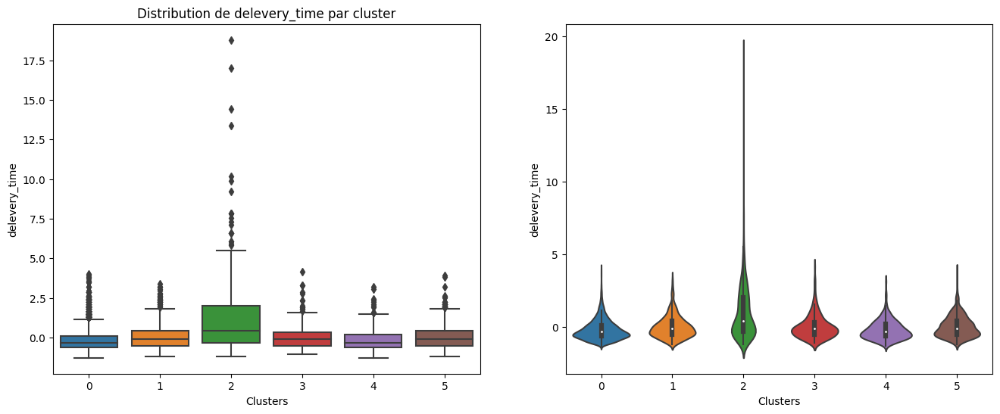

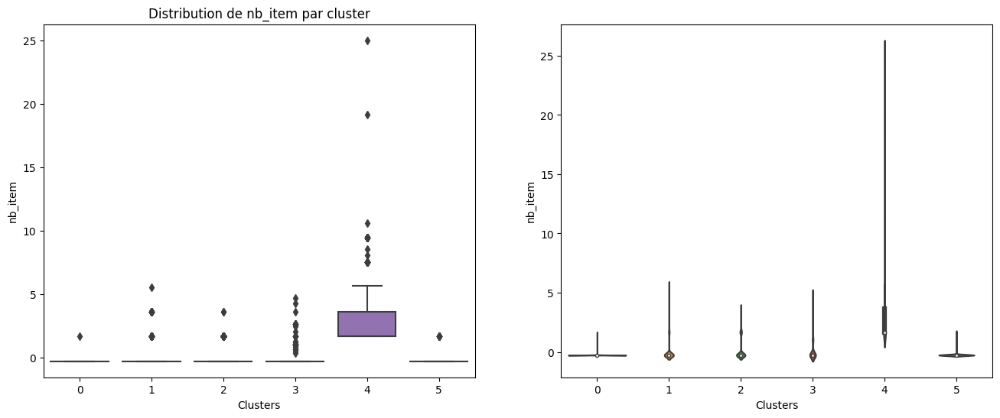

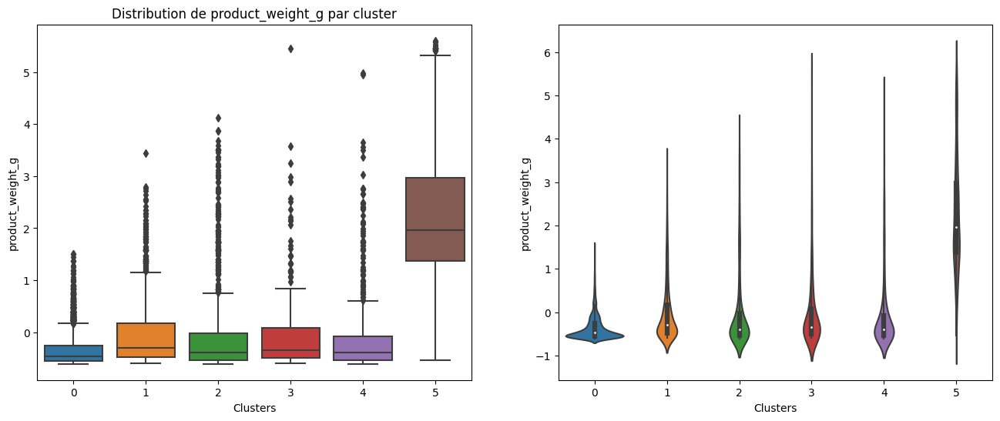

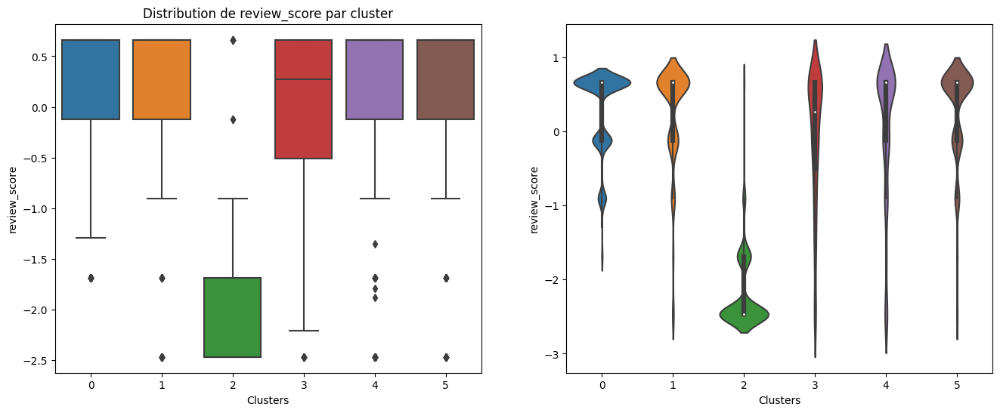

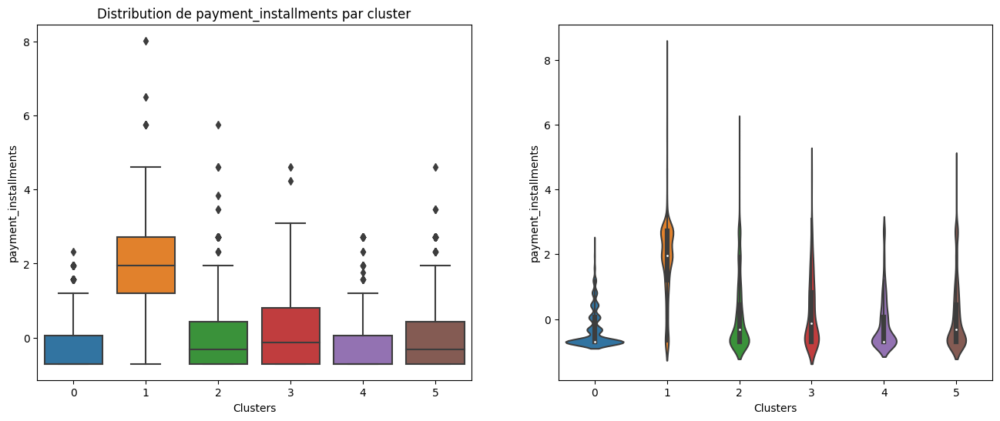

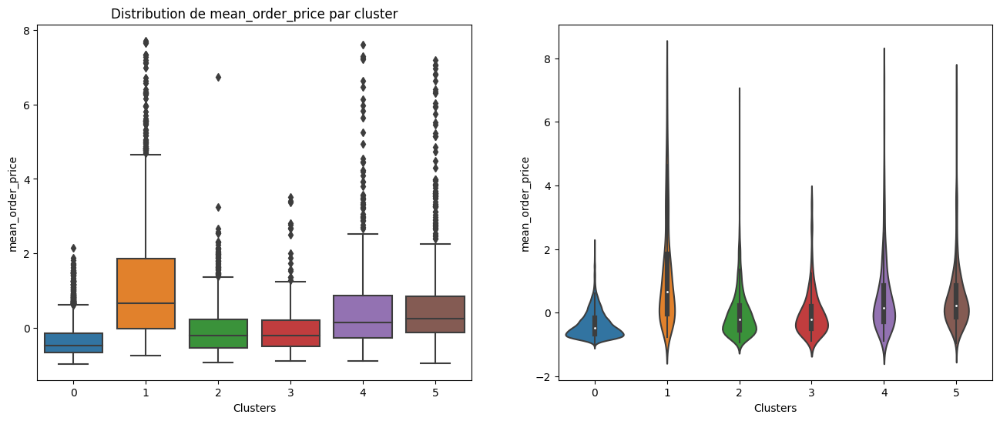

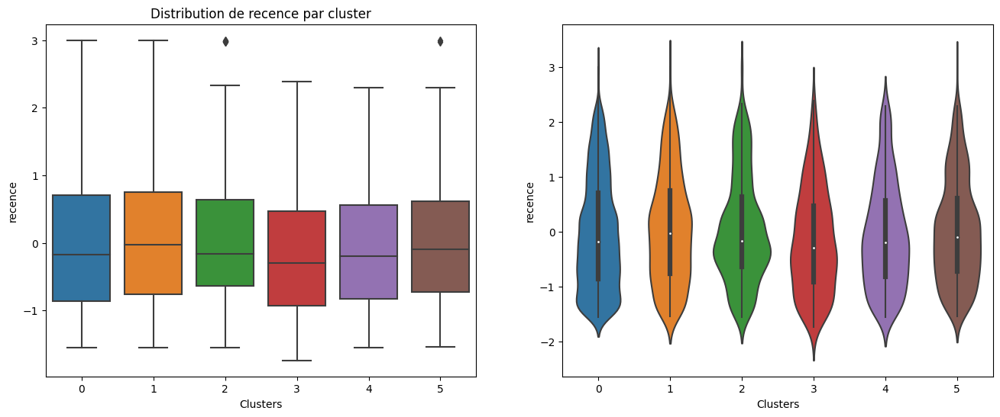

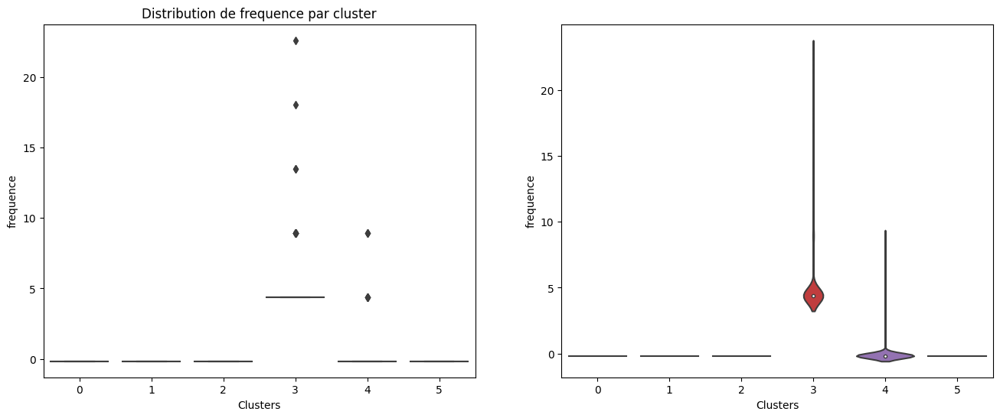

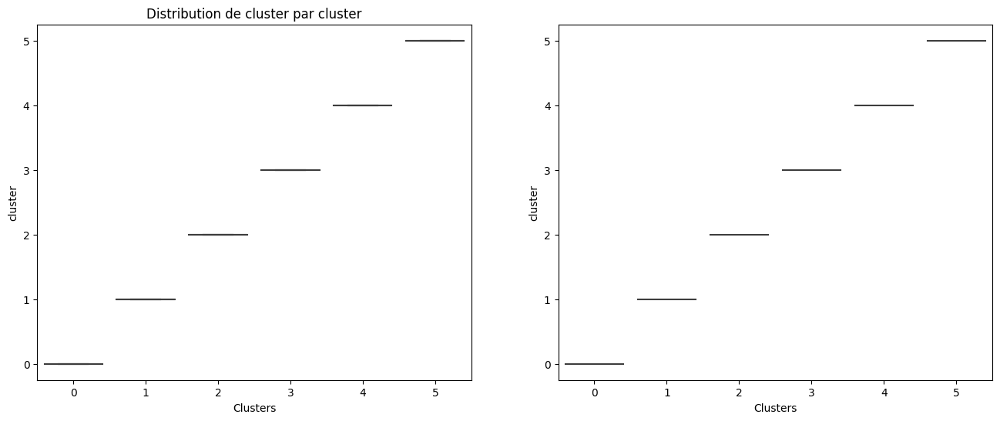

In [105]:
boxplot_cluster(df)

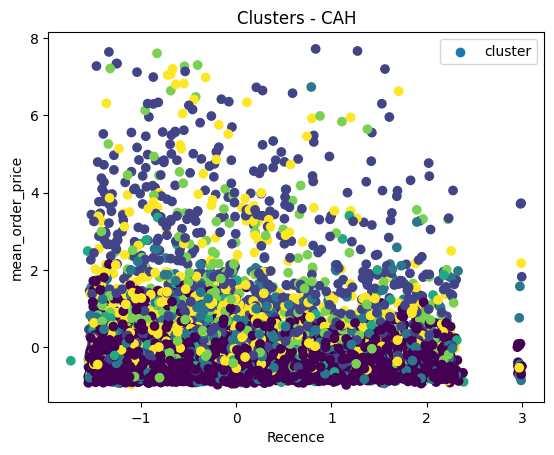

In [120]:
plt.scatter(df['recence'], df['mean_order_price'], c=y_cah, cmap='viridis', label = 'cluster')
plt.title('Clusters - CAH')
plt.xlabel('Recence')
plt.ylabel('mean_order_price')
plt.legend()
plt.show()

# plt.scatter(df['recence'], df['mean_order_price'], c=y_cah, cmap='viridis', label='cluster')

# plt.title('Clusters - CAH')
# plt.xlabel('Recence')
# plt.ylabel('mean_order_price')
# # plt.legend(df['cluster'])
# plt.show()


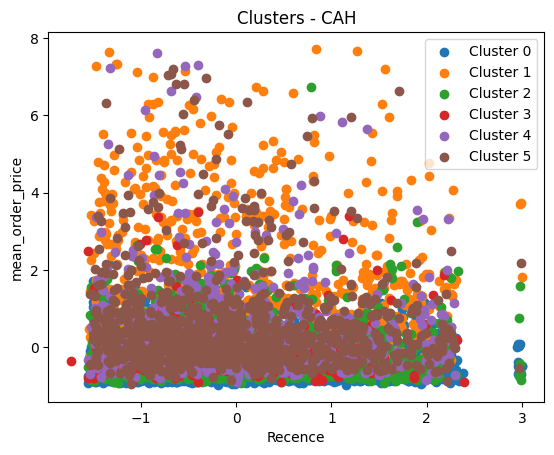

In [108]:
for cluster_num in set(y_cah):
    plt.scatter(df.loc[y_cah == cluster_num, 'recence'], df.loc[y_cah == cluster_num, 'mean_order_price'], 
                label=f'Cluster {cluster_num}')

plt.title('Clusters - CAH')
plt.xlabel('Recence')
plt.ylabel('mean_order_price')
plt.legend()
plt.show()


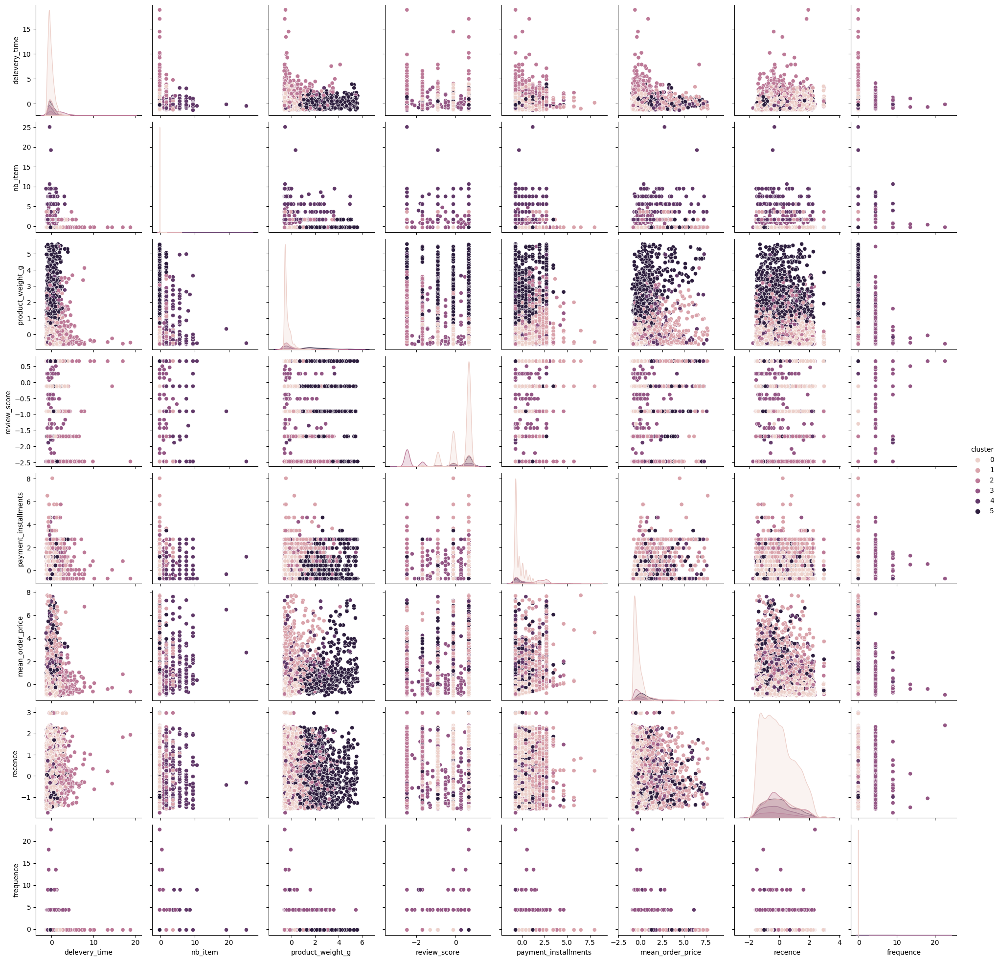

In [121]:
pairplot_cluster(df)

In [ ]:
### test n°2 

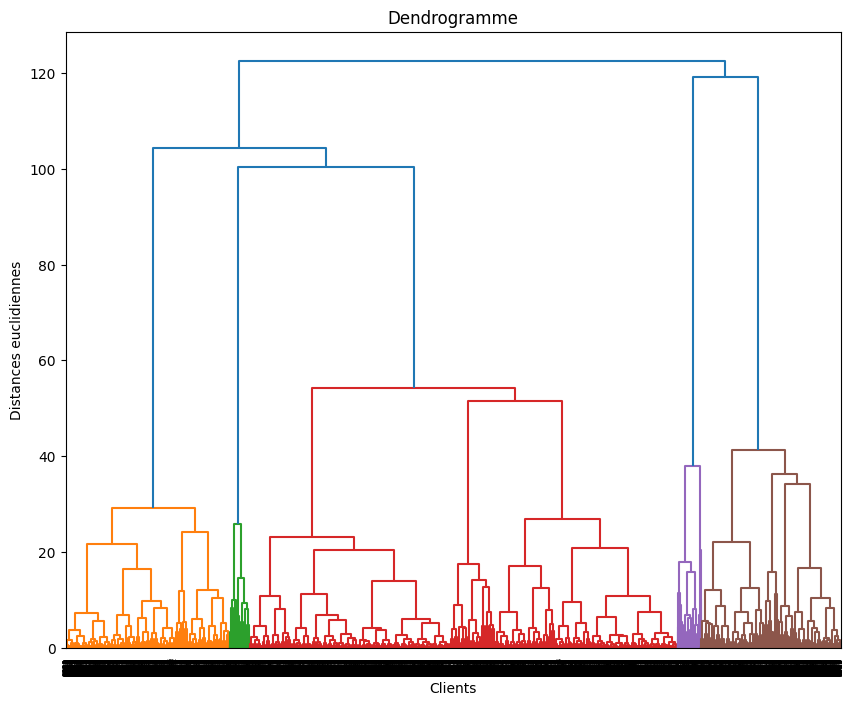

In [71]:
# choix des features
features = ['review_score', 'mean_order_price', 'recence', 'frequence']
df_2 = sampled_df.copy()
df_2 = df_2[features]

#générer la matrice des liens
Z = linkage(df_2,method='ward',metric='euclidean')

#affichage du dendrogramme
plt.figure(figsize=(10,8))
dendrogram(Z)
plt.title("Dendrogramme")
plt.xlabel('Clients')
plt.ylabel('Distances euclidiennes')
plt.show()


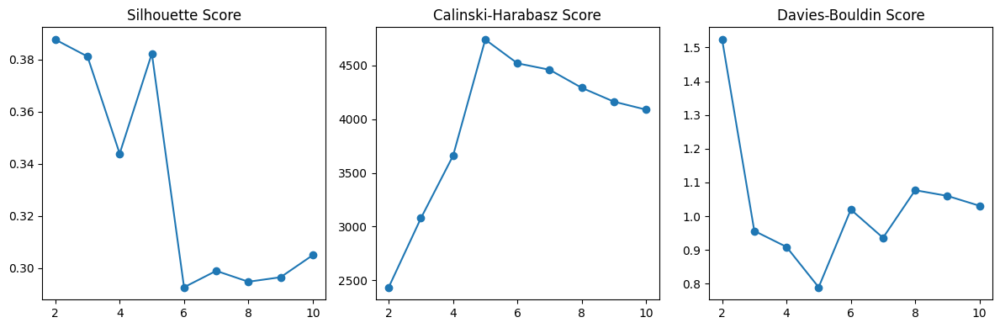

In [87]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score


# X est votre ensemble de données
features = ['review_score', 'mean_order_price', 'recence', 'frequence']
X_2 = sampled_df.copy()
X_2 = X_2[features]

# Liste pour stocker les métriques
silhouette_scores = []
calinski_scores = []
davies_bouldin_scores = []

# Nombre de clusters à tester
for n_clusters in range(2, 11):
    # Appliquer CAH
    CAH = AgglomerativeClustering(n_clusters=n_clusters, metric='euclidean', linkage='ward')
    labels = CAH.fit_predict(X_2)
    
    # Calculer les métriques
    silhouette_scores.append(silhouette_score(X_2, labels))
    calinski_scores.append(calinski_harabasz_score(X_2, labels))
    davies_bouldin_scores.append(davies_bouldin_score(X_2, labels))

# Tracer les métriques
plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.plot(range(2, 11), silhouette_scores, marker='o')
plt.title('Silhouette Score')

plt.subplot(1, 3, 2)
plt.plot(range(2, 11), calinski_scores, marker='o')
plt.title('Calinski-Harabasz Score')

plt.subplot(1, 3, 3)
plt.plot(range(2, 11), davies_bouldin_scores, marker='o')
plt.title('Davies-Bouldin Score')

plt.tight_layout()
plt.show()


In [94]:
df_2.drop(columns='cluster', inplace=True)
df_2.head(2)

,review_score,mean_order_price,recence,frequence
36829,0.662247,-0.577534,-0.826224,-0.166035
36058,-0.902957,1.117534,-0.235783,-0.166035


In [95]:
# Fit le modèle Agglomerative Clustering 

cah_2 = AgglomerativeClustering(n_clusters=5, metric='euclidean', linkage='ward')
y_cah_2 = cah_2.fit_predict(df_2)
df_2['cluster'] = y_cah_2


In [96]:
df_2.cluster.value_counts()

0    5528
3    2122
1    1804
2     295
4     251
Name: cluster, dtype: int64

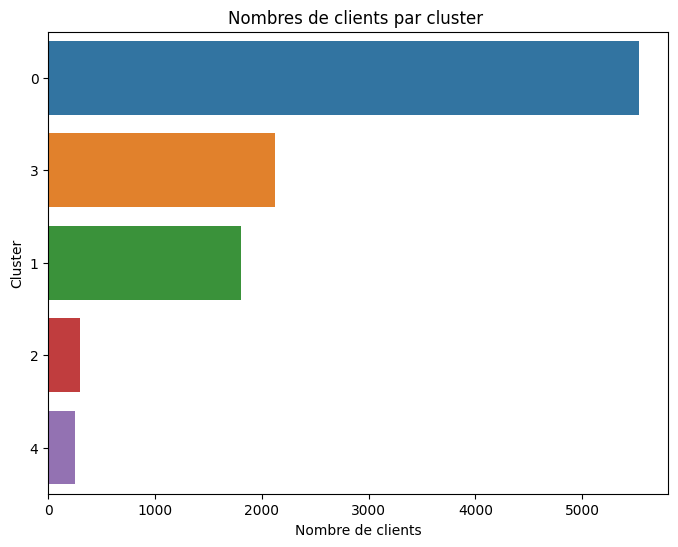

In [97]:
count_cluster(df_2)

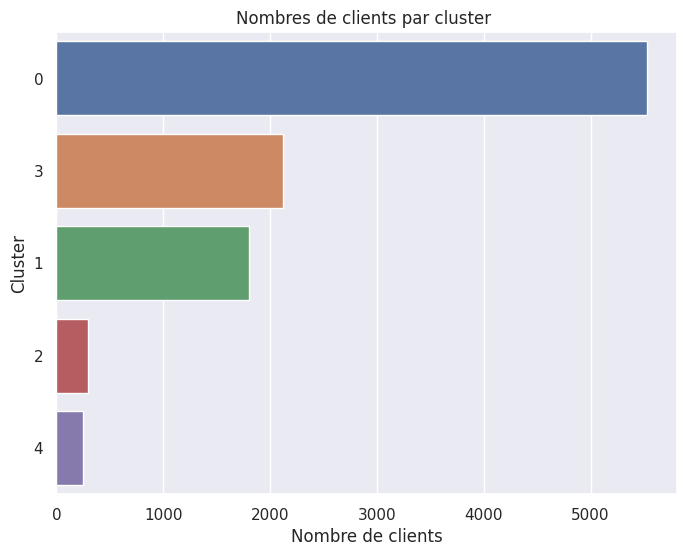

In [124]:
sns.set()
count_cluster(df_2)

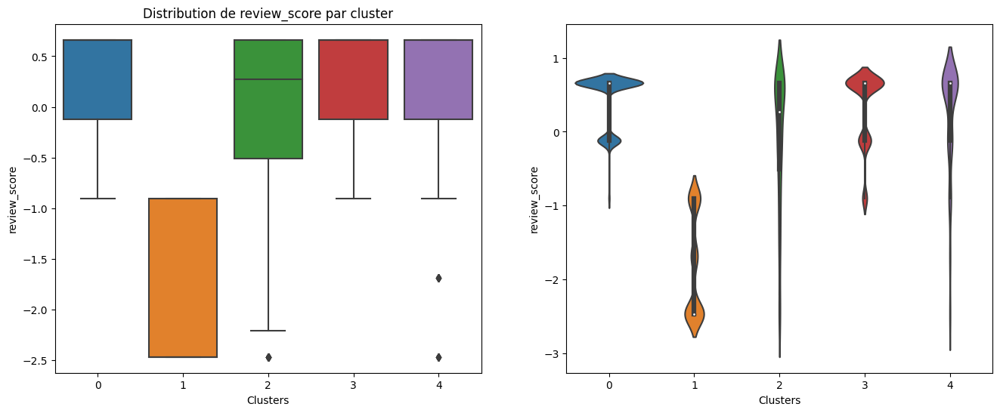

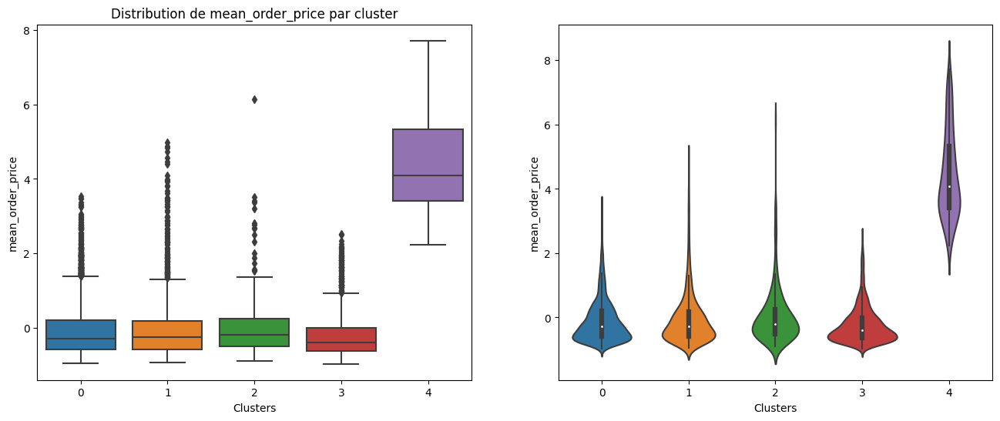

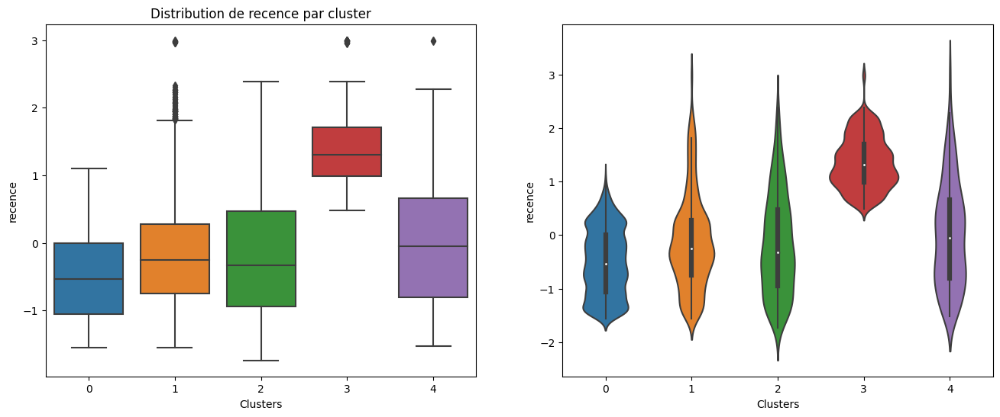

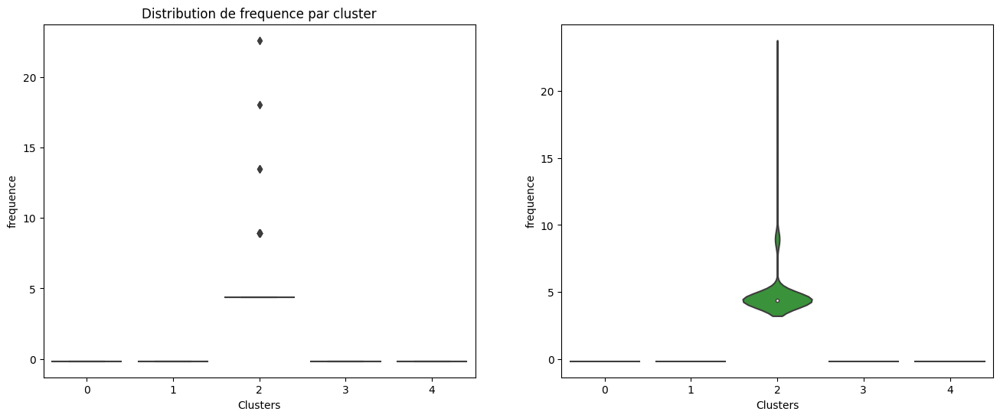

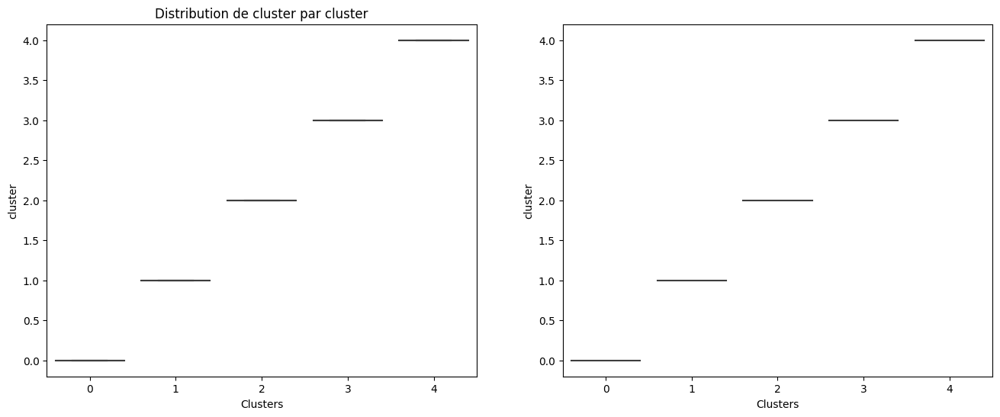

In [98]:
boxplot_cluster(df_2)

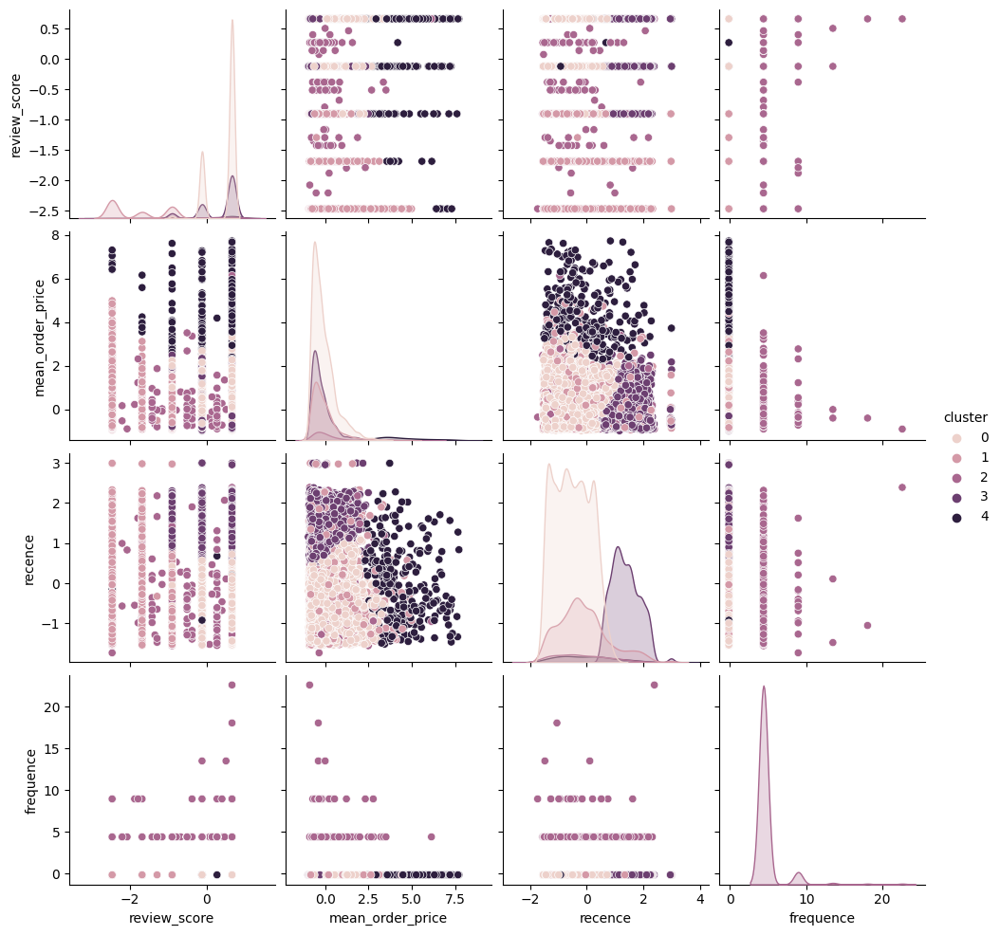

In [99]:
pairplot_cluster(df_2)

Interprétation : 
 - Cluster 0 : Clients plus récents
 - cluster 1 : Clients mécontents
 - Cluster 2 : Clients plus fréquents
 - Cluster 3 : Clients plus anciens
 - Cluster 4 : clients très dépensiers
 
 La segmentation par l'algorithme CAH est proche de la segmentation obtenu avec l'algorithme K-means (test n°4)